In [1]:
import pycuda.driver as cuda
import pycuda.autoinit

In [2]:
import pandas as pd
import numpy as np
import time
import statistics
import holidays
import os

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from IPython.core.interactiveshell import InteractiveShell

from google.cloud import storage

In [3]:
import pymc as pm
import pymc.sampling_jax
import arviz as az
import pytensor.tensor as pt
import pytensor
import xarray as xr

# theano.config.gcc.cxxflags = "-fbracket-depth=1024"
# pytensor.config.gcc__cxxflags = '-Wno-c++11-narrowing -fno-exceptions -fno-unwind-tables 
# -fno-asynchronous-unwind-tables -fbracket-depth=1024'

In [4]:
import plotly.subplots as sp
import plotly.graph_objs as go

In [6]:
pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

InteractiveShell.ast_node_interactivity = "all"
%matplotlib inline

#print(f"Running on PyMC v{pm.__version__}") #PyMC v5.3.0

In [8]:
az.style.use("arviz-darkgrid")
az.rcParams["plot.max_subplots"] = 200

In [10]:
RANDOM_SEED = 8924
compute = "gpu"

if compute == "gpu":
    cuda.init()
    num_gpus = cuda.Device.count()
    os.environ["CUDA_VISIBLE_DEVICES"] = ",".join([str(g) for g in range(num_gpus)])
    
# for i in range(num_gpus):
#     gpu_device = cuda.Device(i)
#     print("GPU ID:", i, "Name:", gpu_device.name())

## Data Read

In [12]:
# set bucket and data names
bucket_name = "448906779370-sanany"

# initiate storage client
client = storage.Client()

# get bucket object
bucket = client.get_bucket(bucket_name)

In [13]:
# filename
filename = "cls755_pr_0418_p0614.csv"
path2file = f"dg-pricing/{filename}"

# read data
start_time = time.time()
data = pd.read_csv(f"gs://{bucket_name}/{path2file}")
end_time = time.time()
print(end_time - start_time)

In [15]:
# lower case column names
data.columns = data.columns.str.lower()

In [16]:
# convert sas date 
# sas date: number of days since January 1, 1960
dt_cols = ['calndr_dt', 'min_date', 'in_stk_dt', 'outstk_dt']

for col in dt_cols:
    data[col] = pd.to_timedelta(data[col], unit='D') + pd.Timestamp('1960-1-1')

# convert sas datetime
# sas datetime: number of seconds since January 1, 1960
ts_cols = ['poffr_beg_ts', 'poffr_end_ts', 'rec_beg_ts', 'rec_end_ts']

for col in ts_cols:
    data[col] = pd.to_timedelta(data[col], unit='s') + pd.Timestamp(1960, 1, 1)

In [17]:
# sort data
data.sort_values(['sku_id', 'chn_id', 'loc_id', 'calndr_dt'], inplace = True)

# convert units to float
data['units'] = data['units'].astype('float')

In [19]:
# set id columns
id_cols = ['sku_id', 'chn_id', 'loc_id']
# set columns to drop
drop_cols = [
    'min_date', 
    'poffr_id', 
    'src_offr_id', 
    'poffr_beg_ts', 
    'poffr_end_ts', 
    'mech_typ_cde', 
    'inc_typ_cde', 
    'inc_typ_desc',
    'rec_beg_ts',
    'rec_end_ts',
    'dur_in_sec',
    'dur_rank',
    'prc_rank',
]
data = data.drop(drop_cols, axis = 1)

In [20]:
# get year, month, quarter, week of month
data['fisc_yr'] = data['fisc_qtr_id'].astype('str').str[:4].astype('float')
data['fisc_qtr'] = data['fisc_qtr_id'].astype('str').str[4:].astype('float')
data['fisc_mth'] = data['fisc_mth_id'].astype('str').str[4:].astype('float')
data['fisc_mwk_nbr'] = data['fisc_mth_wk_nbr'].astype('str').str[-1].astype('float')

# drop columns
data = data.drop(['fisc_qtr_id', 'fisc_mth_id', 'fisc_mth_wk_nbr'], axis=1)

- number of days with 0 demand on sku-loc and sku levels
- number of days with 0 supply on sku-loc and sku levels

In [ ]:
## - number of days with 0 demand & supply on sku-loc and sku levels
# sku-loc
sl_ds0 = data.groupby(['sku_id', 'loc_id']).agg(
    n_days=('calndr_dt', lambda x: x.count()),
    zero_demand_days_cnt=('units', lambda x: x.eq(0).sum()),
    zero_demand_days_pct=('units', lambda x: x.eq(0).sum()/x.count()),
    zero_supply_days_cnt=('inventory', lambda x: x.eq(0).sum()),
    zero_supply_days_pct=('inventory', lambda x: x.eq(0).sum()/x.count()),                      
).reset_index()

# save to pickle
sl_ds0.to_pickle('data/out/sl_ds0.pkl')

# sku
sc_ds0 = data.groupby(['sku_id', 'chn_id', 'calndr_dt']).agg(
    units=('units', lambda x: x.sum()), inventory=('inventory', lambda x: x.sum())
).reset_index().groupby(['sku_id', 'chn_id']).agg(
    n_days=('calndr_dt', lambda x: x.count()),
    zero_demand_days_cnt=('units', lambda x: x.eq(0).sum()),
    zero_demand_days_pct=('units', lambda x: x.eq(0).sum()/x.count()),
    zero_supply_days_cnt=('inventory', lambda x: x.eq(0).sum()),
    zero_supply_days_pct=('inventory', lambda x: x.eq(0).sum()/x.count()),                      
).reset_index()

# save to pickle
sc_ds0.to_pickle('data/out/sc_ds0.pkl')

In [1]:
#print('#### --sku-location level-- ####')
#print(sl_ds0.sort_values('zero_demand_days_pct',ascending=False).head(10))
#print('\n\n')
#print('#### --sku-channel level-- ####')
#print(sc_ds0.sort_values('zero_demand_days_pct',ascending=False).head(10))

In [ ]:
fig = px.scatter(sc_ds0.query("chn_id==110"), x="zero_demand_days_pct", y="zero_supply_days_pct", 
                 hover_name="sku_id", 
                 # size="pop", color="sku_id", log_x=True, size_max=60
                )
fig.show()

**next steps**: \<placeholder\>
> - more days with 0 supply than days with 0 demand?
> - exclude: `['6394471']`
> - investigate: `['6450865','6450860','6509663', '6418602', '6455382']` >20% zero demand days
    - aggregate to weekly-sku?
> - if we were to keep it at `loc_id` level we will need location attributes.


<Axes: xlabel='calndr_dt'>

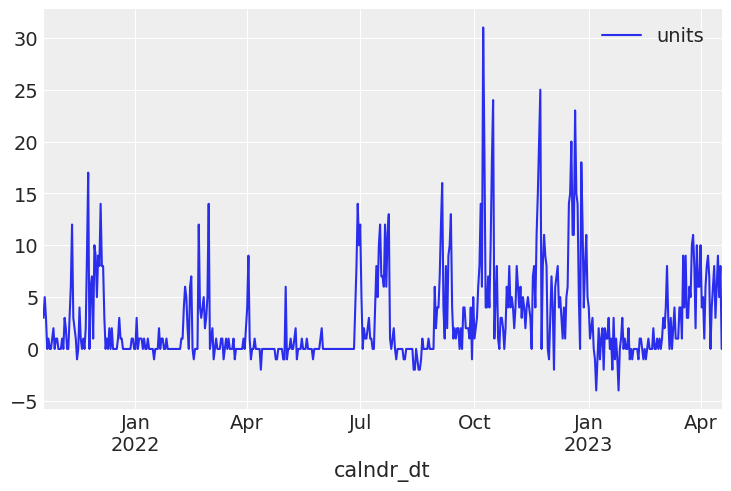

In [ ]:
# data.query('sku_id == 6450865 and chn_id==110')['loc_id'].unique()
data.query('sku_id == 6450865 and chn_id==110').groupby(['sku_id', 'chn_id', 'calndr_dt']).agg(
    units=('units', lambda x: x.sum()),
    revenue=('revenue', lambda x: x.sum()), 
    curr_sale_prc_amt=('curr_sale_prc_amt', lambda x: statistics.mode(x)),
    asp_avg=('asp', lambda x: x.mean()),
).reset_index().set_index('calndr_dt')[['units']].plot()

In [ ]:
# data.query('sku_id == 6450865 and chn_id==110 and loc_id == 7').sort_values(['loc_id', 'calndr_dt'])[['loc_id', 'calndr_dt', 'inventory', 'units', 'asp', 'revenue', 'curr_sale_prc_amt', 'curr_sale_prc_evnt_typ']]

- number of days where `asp` not equal `curr_sale_prc_amt` excluding days with 0 demand on sku-loc

In [ ]:
# number of days where `asp` not equal `curr_sale_prc_amt` excluding days with 0 demand on sku-loc
sl_pae = data.query('units != 0').groupby(['sku_id', 'loc_id']).apply(
    lambda x: pd.Series({
        'non_zero_demand_days': x['calndr_dt'].count(),
        'price_equal_cnt': (x['asp'] == x['curr_sale_prc_amt']).sum(),
        'price_equal_pct': (x['asp'] == x['curr_sale_prc_amt']).sum() / x['calndr_dt'].count(),
        'price_variance_avg': ((x['asp'] - x['curr_sale_prc_amt']) / x['curr_sale_prc_amt']).mean(),
        'price_variance_median': ((x['asp'] - x['curr_sale_prc_amt']) / x['curr_sale_prc_amt']).median(),
        'price_variance_std': ((x['asp'] - x['curr_sale_prc_amt']) / x['curr_sale_prc_amt']).std(),
        
    })
).reset_index()

# save to pickle
sl_pae.to_pickle('data/out/sl_pae.pkl')

print('#### --sku-location level-- ####')
print(sl_pae.head(10))

#### --sku-location level-- ####
    sku_id  loc_id  non_zero_demand_days  price_equal_cnt  price_equal_pct  price_variance_avg  price_variance_median  price_variance_std
0  5721600       4                 381.0            225.0         0.590551           -0.031981               0.000000            0.055192
1  5721600       7                 454.0            295.0         0.649780           -0.021546               0.000000            0.043046
2  5721600       8                 232.0            155.0         0.668103           -0.029883               0.000000            0.053062
3  5721600      10                 290.0            186.0         0.641379           -0.029092               0.000000            0.050124
4  5721600      11                 220.0            150.0         0.681818           -0.024317               0.000000            0.050519
5  5721600      12                 408.0            226.0         0.553922           -0.033027               0.000000            0.048474
6

- daily price (asp) variance on sku-loc and sku levels

In [ ]:
# calculate price variance for non zero demand days
pr_var = data.query('units != 0')[['sku_id', 'chn_id', 'loc_id', 'calndr_dt', 'asp', 'curr_sale_prc_amt']]
pr_var['price_variance'] = (pr_var['asp'] - pr_var['curr_sale_prc_amt']) / pr_var['curr_sale_prc_amt']
# save to pickle
pr_var.to_pickle('data/out/pr_var.pkl')

In [ ]:
# daily price (asp) variance on sku-loc level
# <visual-placeholder>

# daily price (asp) variance on sku level
# <visual-placeholder>

- unique competitors per sku 

In [ ]:
n_skus = len(np.unique(data['sku_id'].values))
             
comp_pr = data[['sku_id', 'calndr_dt'] + [col for col in data.columns if col.startswith('cmptr_prc_')]].drop_duplicates()
temp = ~comp_pr.set_index(['sku_id', 'calndr_dt']).isnull().groupby('sku_id').all().stack()
comps_dtl = pd.DataFrame(temp[temp].index.values.tolist(), columns=['sku', 'comp'])

comps = comps_dtl.groupby('comp').agg(sku_count=('sku', 'count')).sort_values('sku_count', ascending=False)
comps['coverage'] = comps['sku_count'] / n_skus

print(f'{n_skus} unique skus in original dataset')
print(f'{len(np.unique(comps_dtl["sku"].values))} skus have at least 1 non-null value in a competitor price column')
print(comps)

44 unique skus in original dataset
43 skus have at least 1 non-null value in a competitor price column
              sku_count  coverage
comp                             
cmptr_prc_2          43  0.977273
cmptr_prc_10         29  0.659091
cmptr_prc_43          1  0.022727


## Model Building

**POC Iteration #1**
- Aggregate to sku-channel-day level
- Exclude 0 and -ve demand days
- Impute missing competitors price
- Identify gap between 1st and 2nd date where demand <> 0
- Calculate distribution for retail as number of locations

In [22]:
sku_exclude = [6394471]
target_col = 'units'
group_cols = ['sku_id', 'sku_desc', 'class_id', 'class_nm', 'chn_id', 'outstk_dt', 'calndr_dt', 'fisc_wk_of_yr_nbr', 'fisc_day_of_wk_nbr', 'fisc_yr', 'fisc_mth', 'fisc_mwk_nbr']
comp_cols = ['cmptr_prc_2', 'cmptr_prc_10', 'cmptr_prc_43'] 

In [23]:
# replace 0s in `asp` with NaN to exclude 0s in mean calculation
data['asp'] = data['asp'].replace(0, np.nan)

In [24]:
# aggregate data
agg_data = data\
            .query(f'sku_id not in {sku_exclude}')\
            .groupby(group_cols)\
            .agg(
    units=('units', 'sum'),
    inventory=('inventory', 'sum'),
    asp_avg=('asp', 'mean'),
    price=('curr_sale_prc_amt', lambda x: statistics.mode(x)),
    promo=('curr_sale_prc_evnt_typ', lambda x: statistics.mode(x)),
    cmptr_prc_2=('cmptr_prc_2', 'max'),
    cmptr_prc_10=('cmptr_prc_10', 'max'),
    cmptr_prc_43=('cmptr_prc_43', 'max'),
    n_stores=('units', lambda x: np.count_nonzero(x))
    # n_stores=('loc_id', 'count'),
    
).reset_index()

print('aggregated data shape:', agg_data.shape)

aggregated data shape: (29976, 21)


In [25]:
# create trend column
agg_data.sort_values(['sku_id', 'chn_id', 'calndr_dt'], inplace=True)
agg_data['trend'] = agg_data.groupby(['sku_id', 'chn_id']).cumcount()+1
agg_data['trend_p2'] = agg_data['trend'] ** 2


# convert promo to binary
agg_data['promo_flg'] = (agg_data['promo'] == 'P').astype(float)
agg_data.drop('promo', axis=1, inplace=True)

# convert sku_id and chn_id to object
agg_data['sku_id'] = agg_data['sku_id'].astype(str)
agg_data['chn_id'] = agg_data['chn_id'].astype(str)


# convert channel to binary
agg_data['online_flg'] = (agg_data['chn_id'] == '160').astype(float)
agg_data['retail_flg'] = (agg_data['chn_id'] == '110').astype(float)

# convert columns to float
for col in ['inventory', 'n_stores', 'fisc_wk_of_yr_nbr', 'fisc_day_of_wk_nbr', 'trend']:
    agg_data[col] = agg_data[col].astype(float)

# set n-stores to 1 for online channel
agg_data.loc[agg_data['chn_id'] == '160', 'n_stores'] = 1

# transform target
agg_data[f'log_{target_col}'] = np.log(agg_data[target_col])
# transform price
agg_data['log_price'] = np.log(agg_data['price'])

# - AR(1, 7)
agg_data['ar1'] = agg_data.groupby(['sku_id', 'chn_id'])[f'log_{target_col}'].shift(1)
agg_data['ar1'].replace(-np.inf, 0, inplace=True)

agg_data['ar7'] = agg_data.groupby(['sku_id', 'chn_id'])[f'log_{target_col}'].shift(7)
agg_data['ar7'].replace(-np.inf, 0, inplace=True)

# exclude na values
agg_data = agg_data.query('~ar1.isna()').query('~ar7.isna()')

# exclude 0 demand days
agg_data = agg_data.query('units > 0')

# pandemic flag
agg_data['pandemic_flg'] = (agg_data['calndr_dt'].dt.year == 2020).astype(float)
# weekend flag
agg_data['wkend_flg'] = (agg_data['fisc_day_of_wk_nbr'].isin([1, 7])).astype(float)


# price promo interaction
agg_data['log_priceXpromo'] = agg_data['log_price'] * agg_data['promo_flg']
# channel n_stores interaction
agg_data['retailXnstores'] = agg_data['retail_flg'] * agg_data['n_stores']

## seasonal dummy variables
mnth_dummy = pd.get_dummies(agg_data['fisc_mth'], prefix='mnth', dtype=float)
mnth_dummy.columns = [col.removesuffix('.0') for col in mnth_dummy.columns]
agg_data = agg_data.join(mnth_dummy)

# REMOVE OUTLIER: log_units = 2 and log_price < 6.5
agg_data = agg_data.query('log_price > 6.5')

# - Impute Competitor Price
# agg_data.groupby('sku_id')[['cmptr_prc_2', 'cmptr_prc_10', 'cmptr_prc_43']].apply(lambda x: x.isna().sum()/len(x))

agg_data['cmptr_prc_2_flg'] = (~agg_data['cmptr_prc_2'].isna()).astype(float)
agg_data['log_cmptr_prc_2'] = np.log(agg_data['cmptr_prc_2']).fillna(0)
# agg_data['im_cmptr_prc_2'] = agg_data['cmptr_prc_2'].fillna(0)
# agg_data['im_cmptr_prc_2'] = agg_data.groupby(['sku_id', 'chn_id'])['cmptr_prc_2'].fillna(method='ffill').fillna(method='bfill')

agg_data['cmptr_prc_10_flg'] = (~agg_data['cmptr_prc_10'].isna()).astype(float)
agg_data['log_cmptr_prc_10'] = np.log(agg_data['cmptr_prc_10']).fillna(0)
# agg_data['im_cmptr_prc_10'] = agg_data['cmptr_prc_10'].fillna(0)
# agg_data['im_cmptr_prc_10'] = agg_data.groupby(['sku_id', 'chn_id'])['cmptr_prc_10'].fillna(method='ffill').fillna(method='bfill')

## add log and negative exponetial trend
agg_data['trend_log'] = np.log(agg_data['trend'])
agg_data['trend_exp'] = np.exp(-agg_data['trend'])

/home/jupyter/conda_env/dp/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/jupyter/conda_env/dp/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [26]:
# adjust inventory for online
retail_inventory_data = agg_data.loc[agg_data['retail_flg'] == 1.0, ['sku_id', 'calndr_dt', 'inventory']]
retail_inventory_data.rename(columns={'inventory': 'retail_inventory'}, inplace=True)

agg_data = agg_data.merge(retail_inventory_data, on=['sku_id', 'calndr_dt'], how='left')

agg_data['adjusted_inventory'] = np.where(agg_data['retail_flg'] == 0, agg_data['retail_inventory'] + agg_data['inventory'], agg_data['inventory'])

In [27]:
# agg_data['inv_check'] = (agg_data['units'] > agg_data['adjusted_inventory']).astypepe(float)
# agg_data.groupby(['retail_flg', 'sku_id']).agg({'invalid_prop': (x['units'] > x['adjusted_inventory']).sum() / x.count()} 

In [28]:
# holidays
min_year = min(agg_data.calndr_dt).year
max_year = max(agg_data.calndr_dt).year

data_years = list(range(min_year, max_year+1))

us_holidays = holidays.country_holidays('US', years=data_years)

# Standard Holidays parameters
holiday_names_map = {
    "New Year's Day": "newyears",
    "Martin Luther King Jr. Day": "mlking",
    "Washington's Birthday": "gwbirthday",
    "Memorial Day": "memorial",
    "Independence Day": "independence",
    "Labor Day": "labor",
    "Columbus Day": "columbus",
    "Veterans Day": "veterans",
    "Thanksgiving": "thanksgiving",
    "Christmas Day": "christmas"
}

def calc_easter(year):
    "Returns Easter as a date object."
    a = year % 19
    b = year // 100
    c = year % 100
    d = (19 * a + b - b // 4 - ((b - (b + 8) // 25 + 1) // 3) + 15) % 30
    e = (32 + 2 * (b % 4) + 2 * (c // 4) - d - (c % 4)) % 7
    f = d + e - 7 * ((a + 11 * d + 22 * e) // 451) + 114
    month = f // 31
    day = f % 31 + 1    
    return pd.Timestamp(year, month, day)
 

holiday_include = ['christmas', 'independence', 'labor', 'memorial', 'newyears', 'thanksgiving', 'veterans']

def prep_holidays(years, names_map, include, blackfriday=True, easter=True):
        # get standard holiday with dates
        hd = holidays.country_holidays('US', years=years)
        # create a dataframe
        hd_df = pd.DataFrame({'date': list(hd.keys()), 'holiday': list(hd.values())})
        # create new field with r tis names
        hd_df['name'] = hd_df['holiday'].map(names_map)
        # keep only mapped holidays
        hd_df = hd_df.loc[~hd_df['name'].isna(), ['date', 'name']]
        # create holiday indicator
        hd_df['is_hday'] = 1
        # create dummy indicators for each holiday
        hd_df = pd.get_dummies(hd_df, columns=['name'], prefix='hd', prefix_sep='_')
        # DROP PREFIX UNTIL WE CAN ADD THE SAME PREFIX TO WALMART HOLIDAYS
        hd_df.columns = hd_df.columns.str.replace('hd_', '')
        # convert date field from str to datetime
        hd_df['date'] = pd.to_datetime(hd_df['date'], format='%Y-%m-%d')
        
        if blackfriday and 'thanksgiving' in include:
            black_friday = hd_df[hd_df['thanksgiving'] == True].copy(deep=True)
            black_friday['date'] = black_friday['date'] + pd.DateOffset(1)

            black_friday['is_hday'] = 0
            black_friday['blackfriday'] = True
            black_friday['thanksgiving'] = False
            
            hd_df = pd.concat([black_friday, hd_df]).fillna(False)
            include.append('blackfriday')
        
        if easter:
            easter_dates = [calc_easter(yr) for yr in years]
            easter = pd.DataFrame({'date': easter_dates, 'is_hday': 1.0, 'easter': 1.0})
            
            hd_df = pd.concat([easter, hd_df]).fillna(0.0)
            include.append('easter')
        
        hd_df = hd_df[['date', 'is_hday'] + include].sort_values('date').reset_index(drop=True)
        
        
        for col in include + ['is_hday']:
            hd_df[col] = hd_df[col].astype(float)    
        return hd_df

holiday_dummies = prep_holidays(years=data_years, 
                                names_map=holiday_names_map,
                                include=holiday_include,
                                blackfriday=True,
                                easter=True)

holiday_cols = [col for col in holiday_dummies if col!='date']

In [29]:
agg_data = agg_data.merge(holiday_dummies, how='left', left_on='calndr_dt', right_on='date').drop('date', axis=1)
agg_data[holiday_cols] = agg_data[holiday_cols].fillna(0.0)

In [30]:
# remove christmas thanksgiving easter for retail
drop_obs = ((agg_data['christmas'] == 1.0) | (agg_data['easter'] == 1.0) | (agg_data['thanksgiving'] == 1.0)) & (agg_data['retail_flg'] == 1.0)

agg_data["drop_flg"] = 0
agg_data.loc[drop_obs, "drop_flg"] = 1

agg_data = agg_data.query("drop_flg == 0").drop("drop_flg", axis=1)

In [31]:
# agg_data.to_pickle('data/agg_data.pkl')
# agg_data = pd.read_pickle('data/agg_data.pkl')

In [32]:
# encode the sku ids and create a lookup table (dict) for each unique sku, for indexing
sku, sku_ids = agg_data['sku_id'].factorize()
agg_data["sku_code"] = sku
coords = {"sku": sku_ids}

#print(agg_data.shape)
#print(agg_data.dtypes)
#agg_data.head()

In [34]:
# descriptive stats of target - original scale
agg_data[target_col].describe()

count    24698.000000
mean       113.206575
std        207.684018
min          1.000000
25%         13.000000
50%         44.000000
75%        135.000000
max       7887.000000
Name: units, dtype: float64

In [35]:
## cannibalization data

# filename
can_filename = "cls755_pr_can_p0522.csv"
can_path2file = f"dg-pricing/{can_filename}"

# read macro data
start_time = time.time()

can_data = pd.read_csv(f"gs://{bucket_name}/{can_path2file}")

end_time = time.time()
print(end_time - start_time)

# lower case column names
can_data.columns = can_data.columns.str.lower()

# convert sas date 
can_data['calndr_dt'] = pd.to_timedelta(can_data['calndr_dt'], unit='D') + pd.Timestamp('1960-1-1')

# convert sku_id and chn_id to object
can_data['sku_id'] = can_data['sku_id'].astype(str)
can_data['chn_id'] = can_data['chn_id'].astype(str)
can_data['class_id'] = can_data['class_id'].astype(str)

can_lookup = can_data[['sku_id', 'sku_desc']].drop_duplicates()

# Use pivot_table to transform your DataFrame
can_data_l = can_data.pivot_table(values='price', index=['chn_id', 'class_id', 'calndr_dt'], columns='sku_id')

# Reset the index so 'calendar_date' and 'class_id' become columns again
can_data_l.reset_index(inplace=True)

# Add a prefix to the SKU columns
new_cols = []
for col in can_data_l.columns:
    if col not in ['sku_id', 'chn_id', 'class_id', 'calndr_dt']:
        col = 'price_' + col
    new_cols.append(col)

can_data_l.columns = new_cols
can_data_l.index.name = None

10.876421451568604


In [36]:
## identify cannibals per SKU

corr_threshold = 0.5
correlation_list = []
# sku_list = ['6450853']
for s in sku_ids:
    sdata = agg_data.loc[agg_data['sku_id'] == s, ['sku_id', 'chn_id', 'calndr_dt', 'price', 'units']]\
        .merge(can_data_l, on=['chn_id', 'calndr_dt',], how='left')

    pr_cols = [col for col in sdata.columns if col.startswith('price_') and s not in col]

    sdata = sdata[['units'] + pr_cols]
    correlations = sdata.corr(numeric_only=True).loc['units']

    correlations = correlations[~correlations.isna()].sort_values(ascending=False)[1:]
    correlations = correlations[correlations> corr_threshold].reset_index().rename(columns={'index': 'cannibal', 'units': 'correlation'})
    correlations['sku'] = s
    correlations['cannibal_id'] = correlations['cannibal'].str.replace('price_', '')
    correlations['correlation_rank'] = correlations['correlation'].rank(ascending=False, method='first')
    correlations = correlations.merge(can_lookup, left_on="cannibal_id", right_on="sku_id").drop("sku_id", axis=1).rename(columns={"sku_desc": "cannibal_desc"})
    correlations = correlations[['sku', 'cannibal', 'cannibal_id', "cannibal_desc", 'correlation', 'correlation_rank']]
    correlations['n_corr'] = 0
    for can in correlations['cannibal']:
        n_corr = sdata.shape[0] - sdata[[can, 'units']].isna().any(axis=1).sum()
        correlations.loc[correlations['cannibal'] == can, 'n_corr'] += n_corr
    correlations['prop_corr'] = correlations['n_corr'] / sdata.shape[0]
    correlation_list.append(correlations)

cannibalization_stats = pd.concat(correlation_list, axis=0)
# cannibalization_stats.head()

n_threshold = 30

cannibalization_stats = cannibalization_stats[cannibalization_stats['n_corr'] >= n_threshold]
cannibalization_stats = cannibalization_stats[~cannibalization_stats['cannibal_desc'].str.contains('DO NOT SELL')]

# len(cannibalization_stats['cannibal_id'].unique())
# cannibalization_stats

In [37]:
# ## OPTION A: EACH CANNIBAL WOULD HAVE SINGLE EFFECT ESTIMATE ON ALL SKUS [POOLING]

cannibals = list(cannibalization_stats['cannibal'].unique())
cannibalization_df = can_data_l[['chn_id', 'calndr_dt'] + cannibals]
# cannibalization_df.columns = ['chn_id', 'calndr_dt'] + cannibals
cannibalization_df.drop_duplicates(inplace=True)
cannibalization_df = cannibalization_df.groupby(['chn_id', 'calndr_dt']).max()
# test_data = agg_data.copy(deep=True)
agg_data = agg_data.merge(cannibalization_df, on=['chn_id', 'calndr_dt',], how='left')

for can in cannibals:
    trgt_skus = list(cannibalization_stats.loc[cannibalization_stats['cannibal'] == can, 'sku'].unique())
    agg_data[can] = np.log(agg_data[can])
    agg_data.loc[~agg_data['sku_id'].isin(trgt_skus), can] = 0.0
    agg_data[can].fillna(0, inplace=True)

# ## OPTION B: EACH CANNIBAL WOULD HAVE MULTIPLE EFFECT ESTIMATE FOR EACH SKU [NO POOLING]
# cannibalization_stats['cannibal_feature'] = cannibalization_stats['cannibal'] + '_' + cannibalization_stats['sku']
# cannibals_list = list(cannibalization_stats['cannibal'])
# cannibals = cannibalization_stats['cannibal_feature'].tolist()
# cannibalization_df = can_data_l[['chn_id', 'calndr_dt'] + cannibals_list]
# cannibalization_df.columns = ['chn_id', 'calndr_dt'] + cannibals
# cannibalization_df.drop_duplicates(inplace=True)
# cannibalization_df = cannibalization_df.groupby(['chn_id', 'calndr_dt']).max()

# # test_data = agg_data.copy(deep=True)
# agg_data = agg_data.merge(cannibalization_df, on=['chn_id', 'calndr_dt',], how='left')

# for can in cannibals:
#     trgt_skus = list(cannibalization_stats.loc[cannibalization_stats['cannibal_feature'] == can, 'sku'].unique())
#     agg_data[can] = np.log(agg_data[can])
#     agg_data.loc[~agg_data['sku_id'].isin(trgt_skus), can] = 0.0
#     agg_data[can].fillna(0, inplace=True)

## OPTION C: COMBINA OPTION A CODE AND MODEL IT AS A RANDOM EFFECT [PARTIAL POOLING]
#####

/tmp/ipykernel_140/3816771537.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cannibalization_df.drop_duplicates(inplace=True)


In [38]:
## macroeconomic data:

# filename
macro_filename = "CDS_Macro_Daily_01012020_12312023.csv"
macro_path2file = f"dg-pricing/{macro_filename}"

# read macro data
start_time = time.time()

macro_data = pd.read_csv(f"gs://{bucket_name}/{macro_path2file}")

end_time = time.time()
print(end_time - start_time)

# drop duplicate column
macro_data.drop(['LBU.IUSA.1', 'PPI.IUSA.1'], axis=1, inplace=True)

# rename columns
macro_cols_rename = {
    'Mnemonic': 'calndr_dt', 
    'FXCPMGASUQ.IUSA': 'me_gas_prices', 
    'M_FHX.IUSA': 'me_home_sales_base', 
    'M_FCBC.IUSA': 'me_consumer_confidence_index_base', 
    'M_FRILIBOR1M.IUSA': 'me_libor_rates_base', 
    'M_FRT454.IUSA': 'me_retail_ecom_base', 
    'M_FRT.IUSA': 'me_retail_ttl_base', 
    'FRTFS.IUSA': 'me_retail_fs_base', 
    'RTFS.IUSA': 'me_retail_fs', 
    'WRLSP454UA.IUSA': 'me_retail_per_capita_ecom', 
    'FRT.IUSA': 'me_retail_total_base2', 
    'WRLSPRTUA.IUSA': 'me_retail_per_capita_ttl', 
    'CPI.IUSA': 'me_cpi_urban', 
    'IRMM.IUSA': 'me_intrate_ncp', 
    'IRLEND.IUSA': 'me_intrate_ff', 
    'GDP$.IUSA': 'me_gdp', 
    'PPI.IUSA': 'me_ppi', 
    'LBU.IUSA': 'me_unemployment', 
    'NCU18_A065RCQ.IUSA': 'me_income', 
    # 'PPI.IUSA.1': 'me_ppi', 
    # 'LBU.IUSA.1': 'me_unemployment'
}
macro_data.rename(columns=macro_cols_rename, inplace=True)

# convert date str to date
macro_data['calndr_dt'] = pd.to_datetime(macro_data['calndr_dt'], format='%m/%d/%Y')

# drop columns with missing dates
me_miss_cols = ["me_retail_per_capita_ecom", "me_retail_per_capita_ttl", "me_gdp", "me_income"]
macro_data.drop(me_miss_cols, axis=1, inplace=True)

# macro columns
macro_cols = [col for col in macro_data.columns if col!='calndr_dt']

0.11438989639282227


In [39]:
from sklearn.preprocessing import StandardScaler

macros = ['me_consumer_confidence_index_base', 'me_retail_ttl_base', ]  # 'me_gas_prices'

scaler = StandardScaler()
_ = scaler.fit(macro_data[macros])
macro_data_std = pd.concat([macro_data['calndr_dt'], pd.DataFrame(scaler.transform(macro_data[macros]), columns=macros)], axis=1)

In [40]:
# merge with data
agg_data = agg_data.merge(macro_data_std, on = 'calndr_dt', how = 'left')

In [41]:
agg_data.shape

(24698, 98)

In [43]:
agg_data.to_csv('data/agg_data_0719.csv.tar', compression = 'tar', index = False)

### Partial Pooling: Hierarchical Model
- Price varying intercept and slope (elasticity) + Channel + Distribution + Trend + log Trend + Competitor Price (varying slope) + AR(1,7) + Promo + Holidays + Weekend + Pandemic + cannibals + Macros

In [43]:
# Define model
with pm.Model(coords=coords) as model:
    
    ### Register Data
    # ids
    sku_idx = pm.MutableData("sku_idx", sku, dims="obs_id")
    
    # own price
    price_idx = pm.MutableData("log_price", agg_data['log_price'].values, dims="obs_id")
    
    # competitor(s) price
    c2price_flg_idx = pm.MutableData('c2price_flg', agg_data['cmptr_prc_2_flg'].values, dims="obs_id")
    c2price_idx = pm.MutableData('c2price', agg_data['log_cmptr_prc_2'].values, dims="obs_id")
    
    c10price_flg_idx = pm.MutableData('c10price_flg', agg_data['cmptr_prc_10_flg'].values, dims="obs_id")
    c10price_idx = pm.MutableData('c10price', agg_data['log_cmptr_prc_10'].values, dims="obs_id")
    
    # channel
    retail_idx = pm.MutableData("retail", agg_data['retail_flg'].values, dims="obs_id")
    
    # distribution
    retailXnstores_idx = pm.MutableData("retailXnstores", agg_data['retailXnstores'].values, dims="obs_id")
    
    # trend
    trend_idx = pm.MutableData("trend", agg_data['trend'].values, dims="obs_id")
    trend_log_idx = pm.MutableData("trend_log", agg_data['trend_log'].values, dims="obs_id")  # model(6)
    # trend_p2_idx = pm.MutableData("trend_p2", agg_data['trend_p2'].values, dims="obs_id")
    
    # auto-regressive terms
    ar1_idx = pm.MutableData('ar1', agg_data['ar1'].values, dims="obs_id")
    ar7_idx = pm.MutableData('ar7', agg_data['ar7'].values, dims="obs_id")
    
    # promo
    promo_idx = pm.MutableData("promo", agg_data['promo_flg'].values, dims="obs_id")
    
    # pandemic
    pandemic_idx = pm.MutableData("pandemic", agg_data['pandemic_flg'].values, dims="obs_id")
    
    # seasonality: holidays
    h_christmas_idx = pm.MutableData("h_christmas", agg_data['christmas'].values, dims="obs_id")
    h_independence_idx = pm.MutableData("h_independence", agg_data['independence'].values, dims="obs_id")
    h_labor_idx = pm.MutableData("h_labor", agg_data['labor'].values, dims="obs_id")
    h_memorial_idx = pm.MutableData("h_memorial", agg_data['memorial'].values, dims="obs_id")
    h_newyears_idx = pm.MutableData("h_newyears", agg_data['newyears'].values, dims="obs_id")
    h_thanksgiving_idx = pm.MutableData("h_thanksgiving", agg_data['thanksgiving'].values, dims="obs_id")
    h_blackfriday_idx = pm.MutableData("h_blackfriday", agg_data['blackfriday'].values, dims="obs_id")
    h_easter_idx = pm.MutableData("h_easter", agg_data['easter'].values, dims="obs_id")
    h_veterans_idx = pm.MutableData("h_veterans", agg_data['veterans'].values, dims="obs_id")
    
    # seasonality: weekend
    wkend_idx = pm.MutableData("wkend", agg_data['wkend_flg'].values, dims="obs_id")
    
    # seasonality: months
    # mnth_1_idx = pm.MutableData("mnth_1", agg_data['mnth_1'].values, dims="obs_id")
    mnth_2_idx = pm.MutableData("mnth_2", agg_data['mnth_2'].values, dims="obs_id")
    mnth_3_idx = pm.MutableData("mnth_3", agg_data['mnth_3'].values, dims="obs_id")
    mnth_4_idx = pm.MutableData("mnth_4", agg_data['mnth_4'].values, dims="obs_id")
    mnth_5_idx = pm.MutableData("mnth_5", agg_data['mnth_5'].values, dims="obs_id")
    mnth_6_idx = pm.MutableData("mnth_6", agg_data['mnth_6'].values, dims="obs_id")
    mnth_7_idx = pm.MutableData("mnth_7", agg_data['mnth_7'].values, dims="obs_id")
    mnth_8_idx = pm.MutableData("mnth_8", agg_data['mnth_8'].values, dims="obs_id")
    mnth_9_idx = pm.MutableData("mnth_9", agg_data['mnth_9'].values, dims="obs_id")
    mnth_10_idx = pm.MutableData("mnth_10", agg_data['mnth_10'].values, dims="obs_id")
    mnth_11_idx = pm.MutableData("mnth_11", agg_data['mnth_11'].values, dims="obs_id")
    mnth_12_idx = pm.MutableData("mnth_12", agg_data['mnth_12'].values, dims="obs_id")
    
    # seasonality: day of week
    # dow_idx = pm.MutableData("dow", agg_data['fisc_day_of_wk_nbr'].values, dims="obs_id")
    
    ## Define Priors

    # hierarchical (random) effects: intercept priors
    mu_a = pm.Normal("mu_a", mu=0.0, sigma=10.0)
    sigma_a = pm.Exponential("sigma_a", 1)
    # hierarchical (random) effects: price priors
    mu_b = pm.Normal("mu_b", mu=0.0, sigma=10.0)
    sigma_b = pm.Exponential("sigma_b", 1)
    # hierarchical effects: competitor price priors
    mu_bc2 = pm.Normal("mu_bc2", mu=0.0, sigma=10.0) 
    sigma_bc2 = pm.Exponential("sigma_bc2", 1)
    
    mu_bc10 = pm.Normal("mu_bc10", mu=0.0, sigma=10.0) 
    sigma_bc10 = pm.Exponential("sigma_bc10", 1)
    
    # random effect: intercepts
    alpha = pm.Normal("alpha", mu=mu_a, sigma=sigma_a, dims="sku")
    # random effect: price
    beta_price = pm.Normal("beta_price", mu=mu_b, sigma=sigma_b, dims="sku")
    # random effect: competitor price
    beta_c2price_flg = pm.Normal("beta_c2price_flg", mu=0, sigma=1,)
    beta_c2price = pm.Normal("beta_c2price", mu=mu_bc2, sigma=sigma_bc2, dims="sku")  # model 5
    # beta_c2price = pm.Normal("beta_c2price", mu=0, sigma=10,)  # model 4
    
    beta_c10price_flg = pm.Normal("beta_c10price_flg", mu=0, sigma=10,)
    beta_c10price = pm.Normal("beta_c10price", mu=mu_bc10, sigma=sigma_bc10, dims="sku")  # model 5
    # beta_c10price = pm.Normal("beta_c10price", mu=0, sigma=10,)  # model 4
    
    # fixed effect: channel
    beta_retail = pm.Normal("beta_retail", mu=0, sigma=1,)
    # fixed effect: distribution
    beta_retailXnstores = pm.Normal("beta_retailXnstores", mu=0, sigma=10,)
    
    # fixed effect: trend
    beta_trend = pm.Normal("beta_trend", mu=0, sigma=1,)
    beta_trend_log = pm.Normal("beta_trend_log", mu=0, sigma=1,)  # model 6
    # beta_trend_p2 = pm.Normal("beta_trend_p2", mu=0, sigma=1,)
    
    # fixed effect: auto-regressive terms
    beta_ar1 = pm.Normal("beta_ar1", mu=0, sigma=1,)
    beta_ar7 = pm.Normal("beta_ar7", mu=0, sigma=1)
    
    # fixed effect: promo
    beta_promo = pm.Normal("beta_promo", mu=0, sigma=1)
    
    # fixed effect: pandemic
    beta_pandemic = pm.Normal("beta_pandemic", mu=0, sigma=1)
    
    # fixed effect: seasonality - holidays
    beta_h_christmas = pm.Normal("beta_h_christmas", mu=0, sigma=1)
    beta_h_independence = pm.Normal("beta_h_independence", mu=0, sigma=1)
    beta_h_labor = pm.Normal("beta_h_labor", mu=0, sigma=1)
    beta_h_memorial = pm.Normal("beta_h_memorial", mu=0, sigma=1)
    beta_h_newyears = pm.Normal("beta_h_newyears", mu=0, sigma=1)
    beta_h_thanksgiving = pm.Normal("beta_h_thanksgiving", mu=0, sigma=1)
    beta_h_blackfriday = pm.Normal("beta_h_blackfriday", mu=0, sigma=1)
    beta_h_easter = pm.Normal("beta_h_easter", mu=0, sigma=1)
    beta_h_veterans = pm.Normal("beta_h_veterans", mu=0, sigma=1)
    
    # fixed effect: seasonality - weekend
    beta_wkend = pm.Normal("beta_wkend", mu=0, sigma=1)
    
    # fixed effect: seasonality - month
    # beta_mnth1 = pm.Normal("beta_mnth1", mu=0, sigma=10)
    beta_mnth2 = pm.Normal("beta_mnth2", mu=0, sigma=1)
    beta_mnth3 = pm.Normal("beta_mnth3", mu=0, sigma=1)
    beta_mnth4 = pm.Normal("beta_mnth4", mu=0, sigma=1)
    beta_mnth5 = pm.Normal("beta_mnth5", mu=0, sigma=1)
    beta_mnth6 = pm.Normal("beta_mnth6", mu=0, sigma=1)
    beta_mnth7 = pm.Normal("beta_mnth7", mu=0, sigma=1)
    beta_mnth8 = pm.Normal("beta_mnth8", mu=0, sigma=1)
    beta_mnth9 = pm.Normal("beta_mnth9", mu=0, sigma=1)
    beta_mnth10 = pm.Normal("beta_mnth10", mu=0, sigma=1)
    beta_mnth11 = pm.Normal("beta_mnth11", mu=0, sigma=1)
    beta_mnth12 = pm.Normal("beta_mnth12", mu=0, sigma=1)
    
    # fixed effect: seasonality - day of week
    # beta_dow = pm.Normal("beta_dow", mu=0, sigma=10)

    # sigma: model error
    sigma_y = pm.Exponential("sigma_y", 1)
    # Hierarchical variance model
    # mu_sigma = pm.Exponential('mu_sigma', 1.)
    # sd_sigma = pm.Exponential('sd_sigma', 1.)
    # sigma_y = pm.Normal('sigma_y', mu=mu_sigma, sigma=sd_sigma, dims="obs_id")

    # Expected value
    y_hat = alpha[sku_idx] + \
            beta_price[sku_idx] * price_idx + \
            beta_retail * retail_idx + \
            beta_retailXnstores * retailXnstores_idx + \
            beta_trend * trend_idx + \
            beta_trend_log * trend_log_idx + \
            beta_c2price_flg * c2price_flg_idx + \
            beta_c2price[sku_idx] * c2price_idx + \
            beta_c10price_flg * c10price_flg_idx + \
            beta_c10price[sku_idx] * c10price_idx + \
            beta_ar1 * ar1_idx + \
            beta_ar7 * ar7_idx + \
            beta_promo * promo_idx + \
            beta_h_christmas * h_christmas_idx + \
            beta_h_independence * h_independence_idx + \
            beta_h_labor * h_labor_idx + \
            beta_h_memorial * h_memorial_idx + \
            beta_h_newyears * h_newyears_idx + \
            beta_h_thanksgiving * h_thanksgiving_idx + \
            beta_h_blackfriday * h_blackfriday_idx + \
            beta_h_easter * h_easter_idx + \
            beta_h_veterans * h_veterans_idx + \
            beta_wkend * wkend_idx + \
            beta_pandemic * pandemic_idx + \
            beta_mnth2 * mnth_2_idx + \
            beta_mnth3 * mnth_3_idx + \
            beta_mnth4 * mnth_4_idx + \
            beta_mnth5 * mnth_5_idx + \
            beta_mnth6 * mnth_6_idx + \
            beta_mnth7 * mnth_7_idx + \
            beta_mnth8 * mnth_8_idx + \
            beta_mnth9 * mnth_9_idx + \
            beta_mnth10 * mnth_10_idx + \
            beta_mnth11 * mnth_11_idx + \
            beta_mnth12 * mnth_12_idx #+\
            # beta_dow * dow_idx + \
            # beta_mnth1 * mnth_1_idx
            # beta_trend_p2 * trend_p2_idx + \
    
    ## model 6 additions   
            
    for can in cannibals:
        cannibal_idx = pm.MutableData(f'{can}', agg_data[can].values, dims="obs_id")
        beta_cannibal = pm.Laplace(f'beta_{can}', 0, 1,)  # regularization Lasso
        y_hat += beta_cannibal * cannibal_idx
    
    # Model 8 additions
    for macro in macros:
        macro_idx = pm.MutableData(f'{macro}', agg_data[macro].values, dims="obs_id")
        beta_macro = pm.Laplace(f'beta_{macro}', 0, 1,)  # regularization Lasso
        y_hat += beta_macro * macro_idx

    # Data likelihood
    y_like = pm.Normal("y_like", mu=y_hat, sigma=sigma_y, observed=agg_data[f'log_{target_col}'].values, dims="obs_id")

In [ ]:
# %%capture sampling_log
start_time = time.time()

if compute == "gpu":
    with model:
        model_trace = pymc.sampling_jax.sample_numpyro_nuts(draws=60000, tune=8000, random_seed=RANDOM_SEED, chain_method="vectorized", postprocessing_backend="gpu", return_inferencedata=True, chains=4, target_accept=0.95)

elif compute == "cpu":
    with model:
        model_trace = pm.sample(draws = 60000, tune = 8000, random_seed=RANDOM_SEED, cores=50, return_inferencedata=True, chains=4, target_accept = 0.95)

end_time = time.time()
# # Save the captured output to a local file
# with open('data/iter-2/log_model3.txt', 'w') as f:
#     f.write(str(sampling_log))

Compiling...
Compilation time =  0:00:37.494468
Sampling...


warmup:   2% 1253/68000 [26:28<23:46:35,  1.28s/it]

In [49]:
print(end_time - start_time)

31596.1072101593


In [44]:
# save trace
# model_trace.to_netcdf("data/iter-2/model7a_trace.nc")
# # load trace
model_trace = az.from_netcdf("data/iter-2/model8_trace.nc")

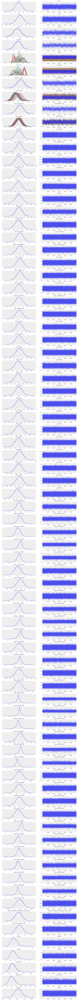

In [45]:
# plot trace
_ = az.plot_trace(model_trace)

In [46]:
# coefficient summary
print(az.summary(model_trace, round_to=2))

                                         mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk   ess_tail  r_hat
mu_a                                    41.85  1.54   39.02    44.79       0.03     0.02   3741.54    9353.46   1.00
mu_b                                    -5.61  0.22   -6.03    -5.20       0.00     0.00   4119.96   11145.27   1.00
mu_bc2                                   0.16  0.06    0.05     0.28       0.00     0.00   1114.94    2472.64   1.01
mu_bc10                                  0.07  0.06   -0.04     0.18       0.00     0.00    839.82    1375.31   1.00
alpha[5721600]                          43.88  1.56   40.89    46.78       0.02     0.01   5508.44   15433.28   1.00
alpha[6418597]                          47.46  1.57   44.54    50.46       0.02     0.01   5623.25   15872.39   1.00
alpha[6418599]                          42.04  1.54   39.17    44.96       0.02     0.01   5634.42   15221.22   1.00
alpha[6418603]                          32.77  1.53   29.93    3

In [47]:
# predictive posterior checks
with model:
    _ = pm.sample_posterior_predictive(model_trace, extend_inferencedata=True, random_seed=RANDOM_SEED)

Sampling: [y_like]


/home/jupyter/conda_env/dp/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)


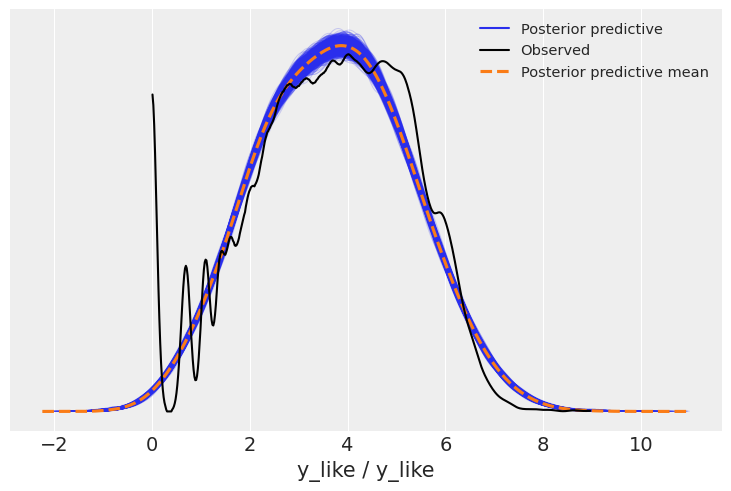

In [48]:
az.plot_ppc(model_trace, num_pp_samples=2000);

In [78]:
## get true and predicted y
# y true
y_true = agg_data[f'log_{target_col}'].values
# y pred
y_pred_mean = model_trace['posterior_predictive']['y_like'].mean(dim=("chain", "draw"))
y_pred = y_pred_mean.data
# y pred cdi
y_pred_cdi = model_trace['posterior_predictive']['y_like'].quantile([.05, .95], dim=("chain", "draw")).data

In [50]:
## Bayesian R2
# # calculate the total variance of the outcome variable
# y_total_var = np.var(y_true)

# # calculate the residual variance of the model
# y_residual_var = np.mean(np.var(y_pred, axis=0))

# # calculate the Bayesian R-squared
# bayesian_r_squared = 1 - y_residual_var / y_total_var

# print('R2 (bayesian):', np.round(bayesian_r_squared, 3))

Pearson correlation: 0.937
R2: 0.877


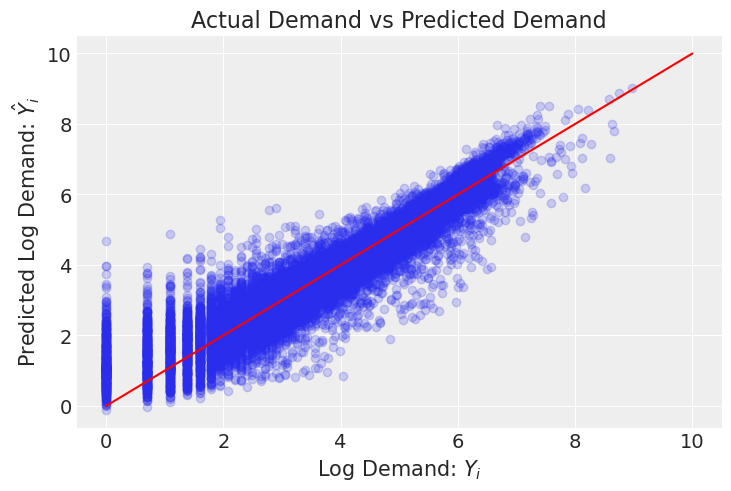

In [51]:
## Y-pred vs Y-true Plot
_ = plt.scatter(y_true, y_pred, alpha=0.2)
_ = plt.plot(range(11), range(11), color='red')
_ = plt.xlabel("Log Demand: $Y_i$")
_ = plt.ylabel("Predicted Log Demand: $\hat{Y}_i$")
_ = plt.title("Actual Demand vs Predicted Demand")

# sns.scatterplot(x=y_true, y=y_pred,) # hue="time", style="time")
pearson_correlation = np.corrcoef(y_true, y_pred)[0,1]
print('Pearson correlation:', round(pearson_correlation,3))
print('R2:', round(pearson_correlation**2, 3))
plt.show()

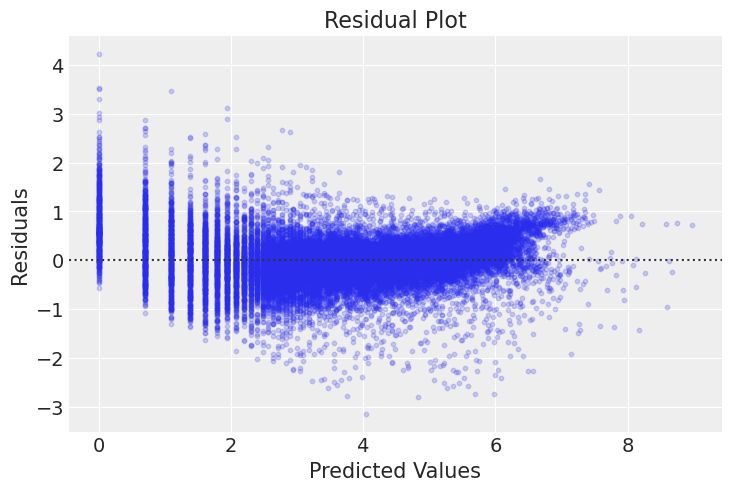

In [52]:
# Residual Plot: Predicted vs Residuals plot
_ = sns.residplot(x=y_true, y=y_pred, scatter_kws={'s': 10, 'alpha': 0.2}, line_kws={'color': 'red'})
_ = plt.xlabel('Predicted Values')
_ = plt.ylabel('Residuals')
_ = plt.title('Residual Plot')
plt.show()

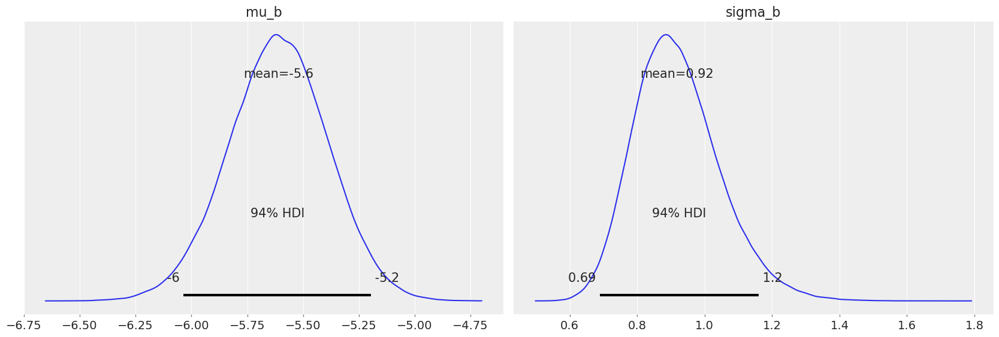

In [53]:
# plot posterior
_ = az.plot_posterior(model_trace, var_names=["mu_b", "sigma_b"],) # ax=ax1)

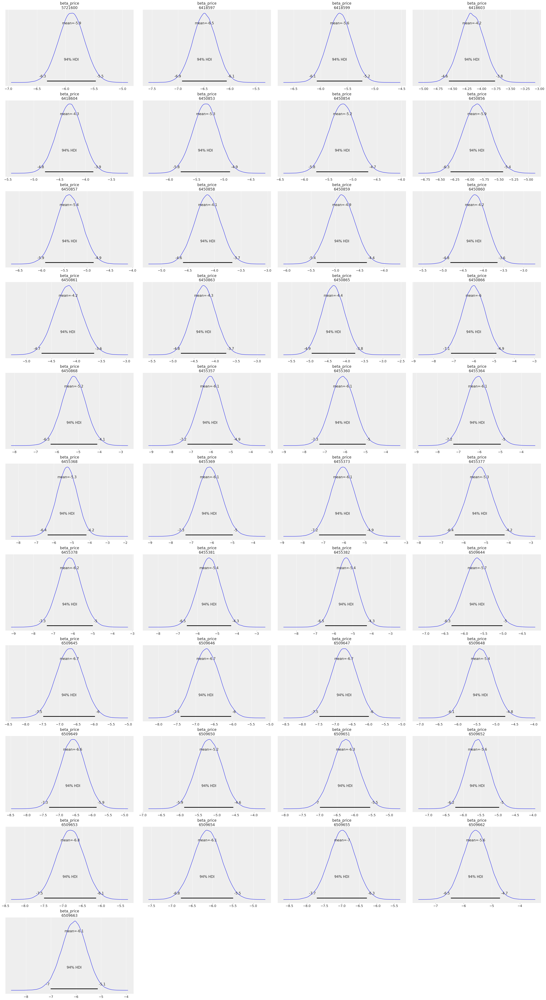

In [54]:
_ = az.plot_posterior(model_trace, var_names=["beta_price"],) # ax=ax1)

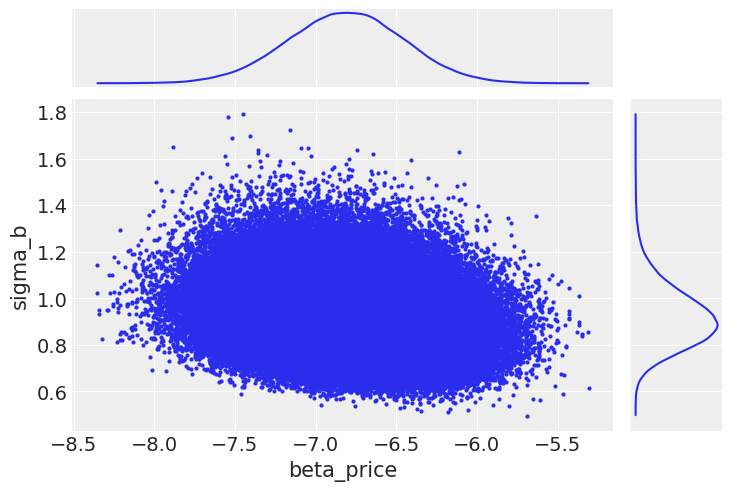

In [55]:
# beta vs sigma (random slope)
ax = az.plot_pair(
    model_trace,
    var_names=["beta_price", "sigma_b"],
    coords=dict(sku="6509653"),
    marginals=True,
    # marginal_kwargs={"kind": "hist"},
)
# ax[1, 0].set_ylim(0, 0.7);

In [56]:
## Residuals Investigation

# calculate residuals
raw_residuals = y_true - y_pred
standardized_residuals = (raw_residuals - np.mean(raw_residuals)) / np.std(raw_residuals)

# add residuals, predictions to data
train_data = agg_data.copy(deep=True)
train_data['raw_residual'] = raw_residuals
train_data['standardized_residual'] = standardized_residuals
train_data['y_pred_mean'] = y_pred
train_data['y_pred_l95'] = y_pred_cdi[0,:]
train_data['y_pred_u95'] = y_pred_cdi[1,:]

In [57]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_pred)) * 100

mape_base_df = train_data.groupby(['sku_id']).apply(lambda group: mape(group['log_units'], group['y_pred_mean'])).reset_index()
mape_base_df.columns = ['sku_id', 'mape']
mape_base_df['accuracy'] = 100 - mape_base_df['mape']
mape_base_df.sort_values('accuracy', ascending=True, inplace=True)
mape_base_df.shape

(41, 3)

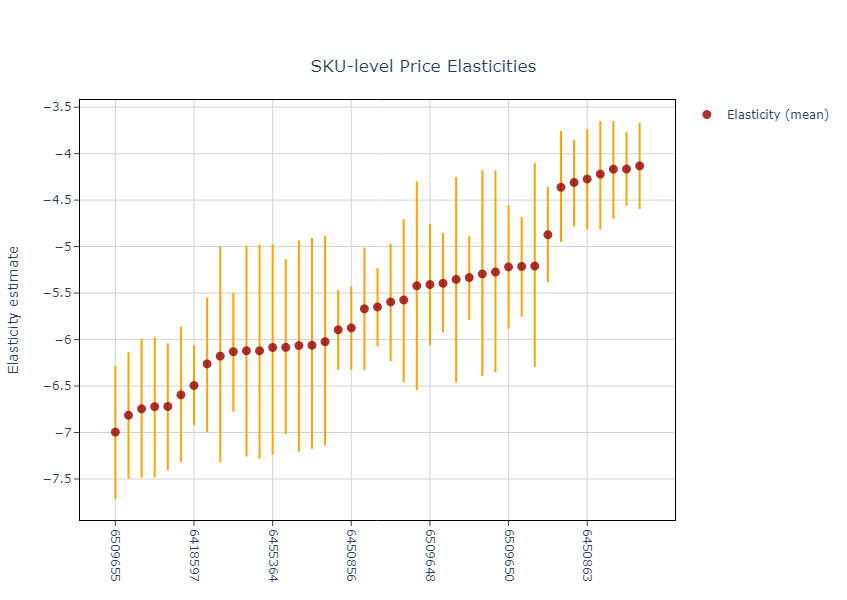

In [58]:
# To identify skus with high elasticities levels, we can plot the ordered mean estimates

ppvars_means = model_trace.posterior.mean(dim=("chain", "draw"))
ppvars_hdi = az.hdi(model_trace)

ppvars_means_iter = ppvars_means.sortby("beta_price")
ppvars_hdi_iter = ppvars_hdi.sortby(ppvars_means_iter.beta_price)

elasticities = pd.DataFrame({
    "sku": ppvars_means_iter['sku'].data,
    "beta_price": ppvars_means_iter["beta_price"].data,
    "lower": ppvars_hdi_iter["beta_price"].data[:,0], 
    "higher": ppvars_hdi_iter["beta_price"].data[:,1]
})

sku_data = agg_data.groupby("sku_id").agg(
    sku_desc=('sku_desc', 'max'),
    out_of_stock=('outstk_dt', 'max'),
    min_date=('calndr_dt', 'min'),
    max_date=('calndr_dt', 'max'),
    n_max=('calndr_dt', lambda x: len(np.unique(x))),
    min_price=('price', 'min'),
    max_price=('price', 'max'),
).reset_index()

elasticities = elasticities\
                    .merge(sku_data, left_on="sku", right_on="sku_id", how="inner").drop("sku_id", axis=1)\
                    .merge(mape_base_df, left_on="sku", right_on="sku_id", how="inner").drop("sku_id", axis=1)

elasticities['mape'] = elasticities['mape']  #/100
elasticities['accuracy'] = elasticities['accuracy']  # /100

# _, ax = plt.subplots(figsize=(12, 5))
# xticks = np.arange(0, 42, 6)
# ppvars_means_iter.plot.scatter(x="sku", y="beta_price", ax=ax, alpha=0.8)
# ax.vlines(
#     np.arange(sku_ids.size),
#     ppvars_hdi_iter.beta_price.sel(hdi="lower"),
#     ppvars_hdi_iter.beta_price.sel(hdi="higher"),
#     color="orange",
#     alpha=0.6,
# )
# ax.set(ylabel="Elasticity estimate",)# ylim=(-2, 4.5))
# ax.set_xticks(xticks)
# ax.set_xticklabels(ppvars_means_iter.sku.values[xticks])
# ax.tick_params(rotation=90);

# Create subplots, this is necessary when you want to have custom xaxis and yaxis properties
fig = sp.make_subplots()


# Add vertical lines equivalent in Plotly
for i in range(sku_ids.size):
    line = go.Scatter(
        x=[elasticities["sku"][i], elasticities["sku"][i]],
        y=[elasticities["lower"][i], elasticities["higher"][i]],
        mode='lines',
        line=dict(color='orange'),
        showlegend=False
    )
    _ = fig.add_trace(line)

# Scatter plot equivalent in Plotly
scatter = go.Scatter(
    x=elasticities["sku"],
    y=elasticities["beta_price"],
    mode='markers',
    marker=dict(
        color='rgba(152, 0, 0, .8)',
        size=9
    ),
    name='Elasticity (mean)',
    customdata=elasticities,
    hovertemplate =
    '<i>Elasticity</i>: %%{y:.2f} [%%{customdata[2]:.2f}, %%{customdata[3]:.2f}]'+
    '<br><b>SKU</b>: %{x}<br>'+
    '<br><b>SKU desc</b>: %{customdata[4]}<br>' + 
    '<br><b>MAPE</b>: %%{customdata[11]:.2f}<br>' + 
    '<br><b>OOS date</b>: %{customdata[5]|%d %b %Y}<br>' +
    '<br><b>Min date</b>: %{customdata[6]|%d %b %Y}<br>' +
    '<br><b>Max date</b>: %{customdata[7]|%d %b %Y}<br>' +
    '<br><b>N (max)</b>: %{customdata[8]:.0f}<br>' +
    '<br><b>Min price</b>: $%{customdata[9]:.2f}<br>' +
    '<br><b>Max price</b>: $%{customdata[10]:.2f}<br>',
)
_ = fig.add_trace(scatter)
# Set y-axis title
_ = fig.update_yaxes(title_text="Elasticity estimate")

# Set x-axis properties (ticks and labels)
xticks = np.arange(0, 42, 6)
_ = fig.update_xaxes(
    tickvals=xticks,
    ticktext=elasticities.sku.values[xticks],
    tickangle=90,
    mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightgrey'
)

_ = fig.update_yaxes(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightgrey')

_ = fig.update_layout(
    title={'text': "SKU-level Price Elasticities", 'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top'},
    # legend=dict(x=0.5, y=-0.1, xanchor='center', yanchor='top', orientation='h'),
    plot_bgcolor='white',
    width=1200, 
    height=600
)

fig.show()

**Residuals and Model Fit**

In [59]:
# mape by sku and channel
mape_df = train_data.groupby(['sku_id', 'retail_flg']).apply(lambda group: mape(group['log_units'], group['y_pred_mean'])).reset_index()
mape_df.columns = ['sku_id', 'retail_flg', 'mape']
mape_df['accuracy'] = 100 - mape_df['mape']
mape_df.sort_values('accuracy', ascending=True, inplace=True)

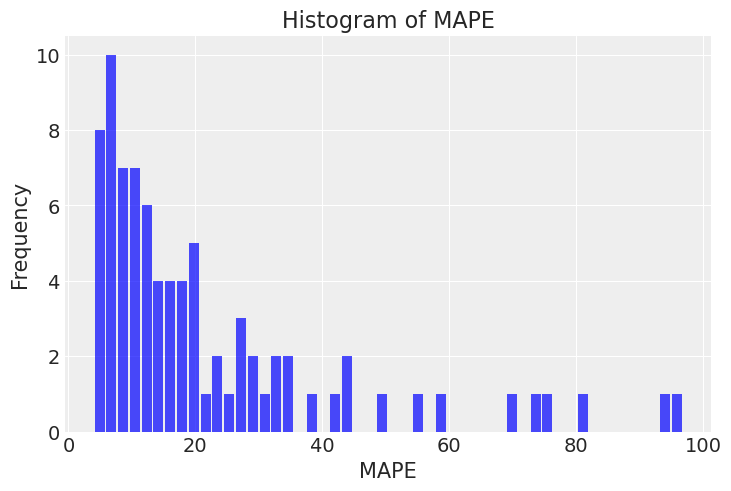

In [60]:
# mape histogram
_ = plt.hist(mape_df['mape'], bins=50, color='blue', alpha=0.7, rwidth=0.85,)
_ = plt.title('Histogram of MAPE')
_ = plt.xlabel('MAPE')
_ = plt.ylabel('Frequency')
_ = plt.grid(True)

In [61]:
# mape stats
mape_df['mape'].describe()

count    82.000000
mean     22.225303
std      20.922139
min       3.966175
25%       8.273785
50%      14.807087
75%      27.804939
max      96.824441
Name: mape, dtype: float64

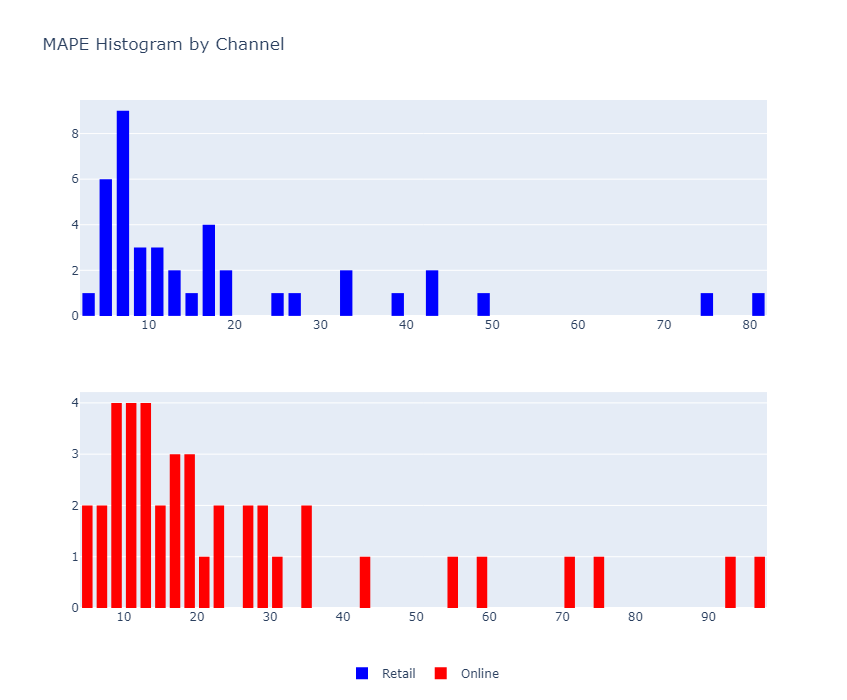

In [62]:
# Create subplot object
fig = sp.make_subplots(rows=2, cols=1)

# Create histogram for channel 1
_ = fig.add_trace(
    go.Histogram(
        x=mape_df.loc[mape_df['retail_flg']==1 ,'mape'],
        name='Retail',
        marker=dict(
            color='blue'
        ),
        nbinsx=50
    ),
    row=1,
    col=1
)

# Create histogram for channel 2
_ = fig.add_trace(
    go.Histogram(
        x=mape_df.loc[mape_df['retail_flg']==0 ,'mape'],
        name='Online',
        marker=dict(
            color='red'
        ),
        nbinsx=50
    ),
    row=2,
    col=1
)

# Set layout properties
_ = fig.update_layout(
    title_text='MAPE Histogram by Channel',
    bargap=0.1,
    bargroupgap=0.2,
    height=700,
    legend=dict(x=0.5, y=-0.1, xanchor='center', yanchor='top', orientation='h'),
)

fig.show()

In [63]:
mape_df.groupby(['retail_flg'])['mape'].describe()

,count,mean,std,min,25%,50%,75%,max
retail_flg,,,,,,,,
0.0,41.0,26.044787,23.102956,5.094658,11.011123,17.610855,29.040620,96.824441
1.0,41.0,18.405818,17.965587,3.966175,7.244224,10.345684,19.679381,80.424915


In [64]:
# high mape skus
mape_df[mape_df['mape'] > 75]

,sku_id,retail_flg,mape,accuracy
52,6455382,0.0,96.824441,3.175559
40,6455368,0.0,93.434978,6.565022
41,6455368,1.0,80.424915,19.575085


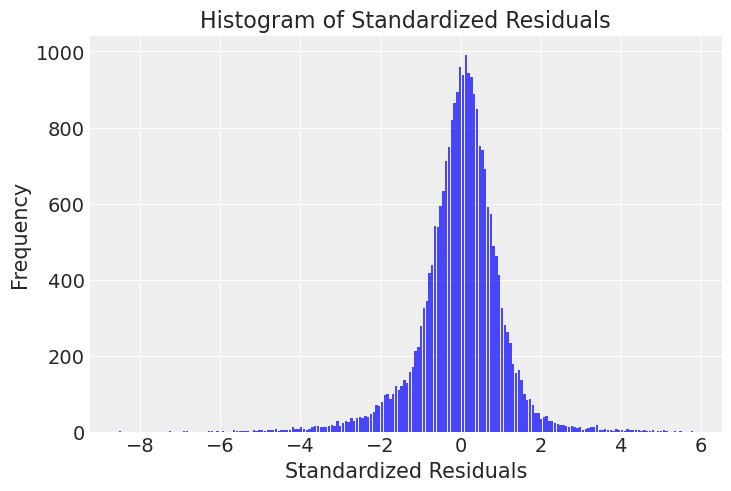

In [65]:
# standardized residuals histogram
_ = plt.hist(train_data['standardized_residual'], bins='auto', color='blue', alpha=0.7, rwidth=0.85)
_ = plt.title('Histogram of Standardized Residuals')
_ = plt.xlabel('Standardized Residuals')
_ = plt.ylabel('Frequency')
_ = plt.grid(True)

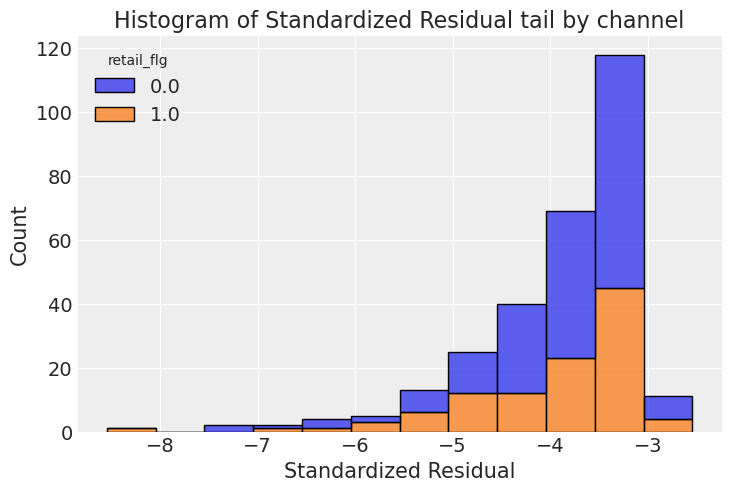

In [66]:
# standardized residuals histogram by channel

# _ = plt.figure(figsize=(10,6))
_ = sns.histplot(data=train_data.loc[train_data['standardized_residual'] < -3,], x='standardized_residual', hue='retail_flg', multiple='stack', binwidth=0.5)
_ = plt.title('Histogram of Standardized Residual tail by channel')
_ = plt.xlabel('Standardized Residual')
_ = plt.ylabel('Count')

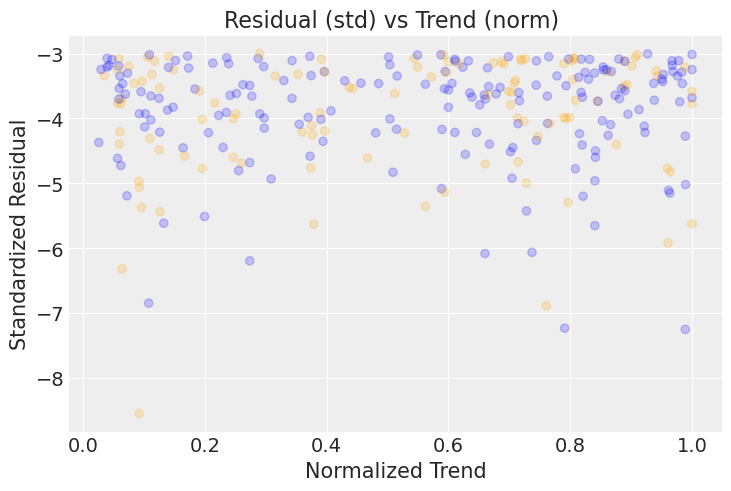

In [67]:
# residuals location across time series

# normalize trend: calculate max value within group then divide by max value within group
train_data['normalized_trend'] = train_data['trend'] / train_data.groupby(['sku_id', 'chn_id'])['trend'].transform('max')

## resid vs normalized trend Plot
# graph data
gdat = train_data.loc[train_data['standardized_residual'] < -3,].copy(deep=True)

# plot
colors = {1:'orange', 0:'blue'} # create a color dictionary for each unique group

_ = plt.scatter(gdat['normalized_trend'], gdat['standardized_residual'], alpha=0.2, c=gdat['retail_flg'].map(colors))
_ = plt.xlabel("Normalized Trend")
_ = plt.ylabel("Standardized Residual")
_ = plt.title("Residual (std) vs Trend (norm) ")

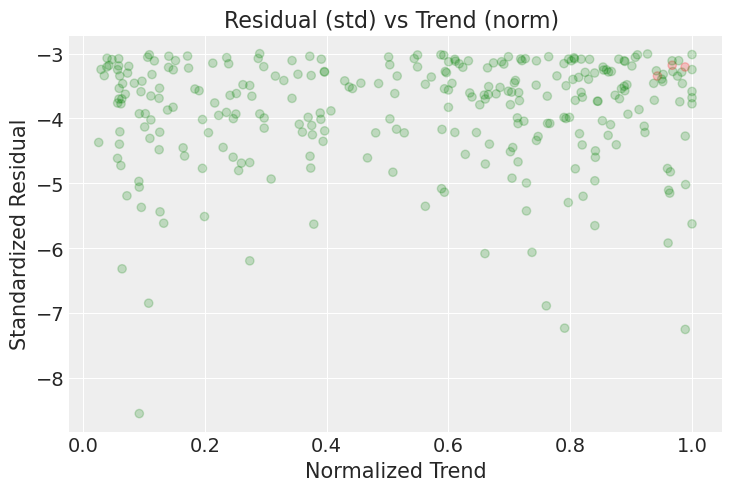

In [68]:
## # residuals location across time series grouped by out of stock date

# graph data
gdat = train_data.loc[train_data['standardized_residual'] < -3,].copy(deep=True)
gdat['outstk_flg'] = (gdat['calndr_dt'] > gdat['outstk_dt']).astype(float)

# plot
colors = {1:'red', 0:'green'}
_ = plt.scatter(gdat['normalized_trend'], gdat['standardized_residual'], alpha=0.2, c=gdat['outstk_flg'].map(colors))
_ = plt.xlabel("Normalized Trend")
_ = plt.ylabel("Standardized Residual")
_ = plt.title("Residual (std) vs Trend (norm) ")

In [69]:
# gdat = train_data.loc[train_data['standardized_residual'] < -3,].copy(deep=True)
sku = "6450853" #"6455357"
retail = 0
gdat = train_data.loc[(train_data['sku_id'] == sku) & (train_data['retail_flg'] == retail), :].copy(deep=True)

sku_description = np.unique(train_data['sku_desc'])[0]

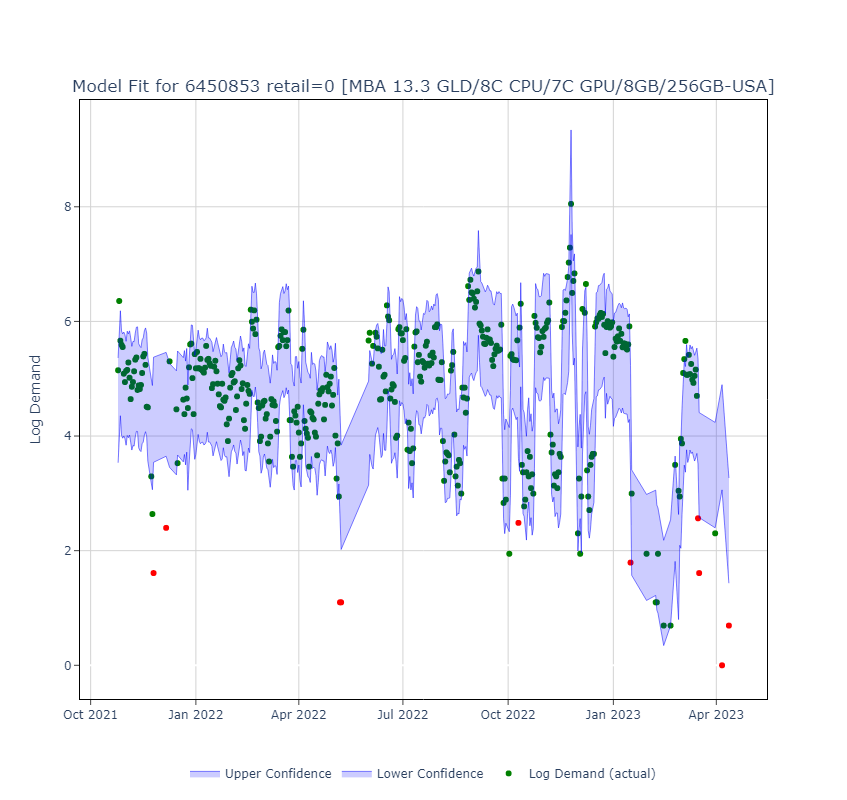

In [70]:
clr = np.where(gdat['standardized_residual'] < -3, 'red', 'green')

# _ = plt.figure(figsize=(15,6))
# # _ = plt.scatter(gdat['calndr_dt'], gdat['log_units'], color='green', alpha=0.5)
# _ = plt.scatter(gdat['calndr_dt'], gdat['log_units'], color=clr, alpha=0.5)
# # _ = plt.plot(gdat['calndr_dt'], gdat['log_units'], linewidth=1, color='green', alpha=0.5)
# _ = plt.fill_between(gdat['calndr_dt'], gdat['y_pred_l95'], gdat['y_pred_u95'], color='blue', alpha=.2)
# _ = plt.xlabel("")
# _ = plt.ylabel("Log Demand")
# _ = plt.title(f"Model Fit for {sku} retail={retail} \n [{sku_description}]")

fig = go.Figure()

_ = fig.add_trace(go.Scatter(x=gdat['calndr_dt'], y=gdat['log_units'], mode='markers', marker=dict(color=clr), opacity=0.5, name='Log Demand (actual)',))
_ = fig.add_trace(go.Scatter(x=gdat['calndr_dt'], y=gdat['y_pred_l95'], mode='lines', line=dict(width=0.5, color='blue'), fill='tonexty', fillcolor='rgba(0, 0, 255, 0.2)', name='Lower Confidence'))
_ = fig.add_trace(go.Scatter(x=gdat['calndr_dt'], y=gdat['y_pred_u95'], mode='lines', line=dict(width=0.5, color='blue'), fillcolor='rgba(0, 0, 255, 0.2)', fill='tonexty', name='Upper Confidence'))

# # Adding y_pred line
# _ = fig.add_trace(go.Scatter(x=gdat['calndr_dt'], 
#                          y=gdat['y_pred_mean'],  # Change this to your y_pred data
#                          mode='markers', # mode='lines', 
#                          marker=dict(color='rgba(0, 0, 255, 0.5)'), # line=dict(color='rgba(0, 0, 255, 0.5)'), 
#                          name='Prediction'
#                         )
#              )

_ = fig.update_layout(title={'text': f"Model Fit for {sku} retail={retail} [{sku_description}]", 'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top'}, 
                      xaxis_title='',
                      yaxis_title='Log Demand',
                      plot_bgcolor='white',
                      autosize=False,
                      width=1200, 
                      height=800,
                      legend=dict(x=0.5, y=-0.1,  xanchor='center', yanchor='top',orientation='h')
                     )

_ = fig.update_xaxes(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightgrey')
_ = fig.update_yaxes(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightgrey')

fig.show()

In [71]:
# gdat = train_data.loc[train_data['standardized_residual'] < -3,].copy(deep=True)
sku = "6455357" # "6450853"
retail = 0
gdat = train_data.loc[(train_data['sku_id'] == sku) & (train_data['retail_flg'] == retail), :].copy(deep=True)

sku_description = np.unique(train_data['sku_desc'])[0]

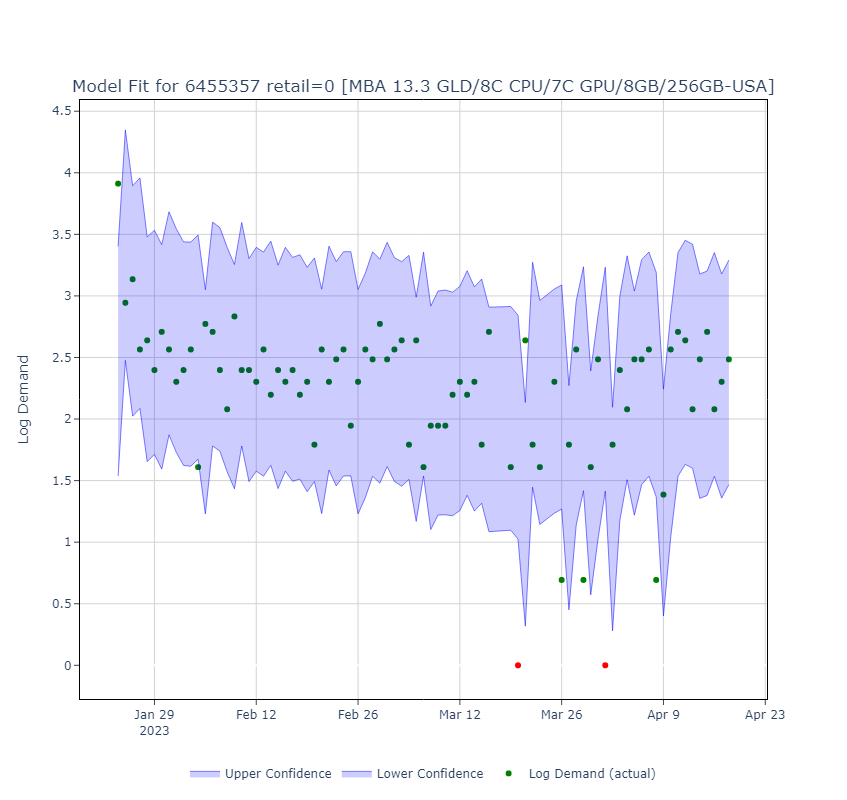

In [72]:
clr = np.where(gdat['standardized_residual'] < -3, 'red', 'green')

# _ = plt.figure(figsize=(15,6))
# # _ = plt.scatter(gdat['calndr_dt'], gdat['log_units'], color='green', alpha=0.5)
# _ = plt.scatter(gdat['calndr_dt'], gdat['log_units'], color=clr, alpha=0.5)
# # _ = plt.plot(gdat['calndr_dt'], gdat['log_units'], linewidth=1, color='green', alpha=0.5)
# _ = plt.fill_between(gdat['calndr_dt'], gdat['y_pred_l95'], gdat['y_pred_u95'], color='blue', alpha=.2)
# _ = plt.xlabel("")
# _ = plt.ylabel("Log Demand")
# _ = plt.title(f"Model Fit for {sku} retail={retail} \n [{sku_description}]")

fig = go.Figure()

_ = fig.add_trace(go.Scatter(x=gdat['calndr_dt'], y=gdat['log_units'], mode='markers', marker=dict(color=clr), opacity=0.5, name='Log Demand (actual)',))
_ = fig.add_trace(go.Scatter(x=gdat['calndr_dt'], y=gdat['y_pred_l95'], mode='lines', line=dict(width=0.5, color='blue'), fill='tonexty', fillcolor='rgba(0, 0, 255, 0.2)', name='Lower Confidence'))
_ = fig.add_trace(go.Scatter(x=gdat['calndr_dt'], y=gdat['y_pred_u95'], mode='lines', line=dict(width=0.5, color='blue'), fillcolor='rgba(0, 0, 255, 0.2)', fill='tonexty', name='Upper Confidence'))

# # Adding y_pred line
# _ = fig.add_trace(go.Scatter(x=gdat['calndr_dt'], 
#                          y=gdat['y_pred_mean'],  # Change this to your y_pred data
#                          mode='markers', # mode='lines', 
#                          marker=dict(color='rgba(0, 0, 255, 0.5)'), # line=dict(color='rgba(0, 0, 255, 0.5)'), 
#                          name='Prediction'
#                         )
#              )

_ = fig.update_layout(title={'text': f"Model Fit for {sku} retail={retail} [{sku_description}]", 'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top'}, 
                      xaxis_title='',
                      yaxis_title='Log Demand',
                      plot_bgcolor='white',
                      autosize=False,
                      width=1200, 
                      height=800,
                      legend=dict(x=0.5, y=-0.1,  xanchor='center', yanchor='top',orientation='h')
                     )

_ = fig.update_xaxes(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightgrey')
_ = fig.update_yaxes(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightgrey')

fig.show()

0.17550857598723574
0.9951492230535229


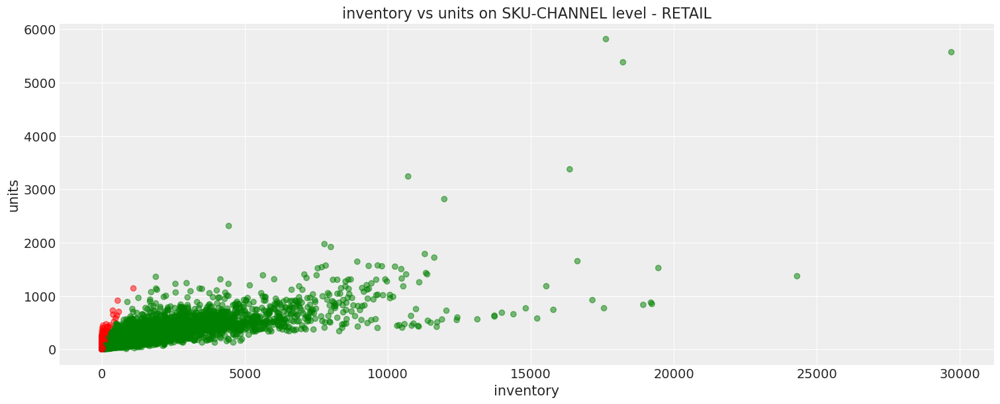

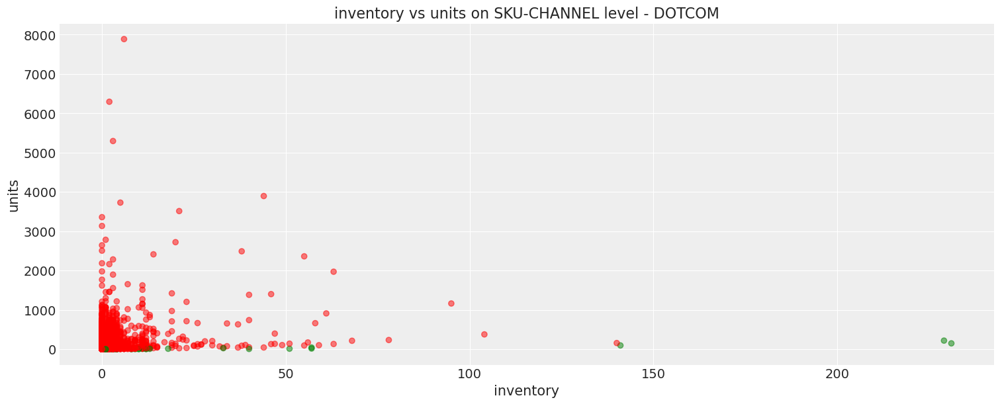

In [73]:
## demand > units
# Retail
filter_retail = ((agg_data['retail_flg'] == 1))
clr = np.where(agg_data.loc[filter_retail, 'units'] > agg_data.loc[filter_retail, 'inventory'], 'red', 'green')
print((agg_data.loc[filter_retail, 'units'] > agg_data.loc[filter_retail, 'inventory']).sum() / agg_data.loc[agg_data['retail_flg'] == 1, 'inventory'].shape[0])

_ = plt.figure(figsize=(15,6))
_ = plt.scatter(agg_data.loc[filter_retail, 'inventory'], agg_data.loc[filter_retail, 'units'], color=clr, alpha=0.5)
_ = plt.xlabel("inventory")
_ = plt.ylabel("units")
_ = plt.title(f"inventory vs units on SKU-CHANNEL level - RETAIL")

# DOTCOM
filter_dotcom = ((agg_data['retail_flg'] == 0))
clr = np.where(agg_data.loc[filter_dotcom, 'units'] > agg_data.loc[filter_dotcom, 'inventory'], 'red', 'green')
print((agg_data.loc[filter_dotcom, 'units'] > agg_data.loc[filter_dotcom, 'inventory']).sum() / agg_data.loc[filter_dotcom, 'inventory'].shape[0])
_ = plt.figure(figsize=(15,6))
_ = plt.scatter(agg_data.loc[filter_dotcom, 'inventory'], agg_data.loc[filter_dotcom, 'units'], color=clr, alpha=0.5)
_ = plt.xlabel("inventory")
_ = plt.ylabel("units")
_ = plt.title(f"inventory vs units on SKU-CHANNEL level - DOTCOM")

In [74]:
# gdat[gdat['calndr_dt'] > '2022-05-10']

# holiday_dummies

# train_data.loc[train_data['standardized_residual'] < -3, :].groupby(['calndr_dt','retail_flg'])['calndr_dt'].count().sort_values(ascending=False)

# train_data.loc[train_data['standardized_residual'] < -3, :].groupby(['sku_id','retail_flg',])['calndr_dt'].count().sort_values(ascending=False)

In [75]:
print('done')

done


### Bayesian Price Demand Curve

In [76]:
## get posteriors for all params split into fixed and random

coeffs_posterior = model_trace.posterior.mean(dim=('chain')).to_dataframe()

random_cols = ['alpha', 'beta_price', 'beta_c2price', 'beta_c10price']
fixed_cols = [col for col in coeffs_posterior.columns if col not in random_cols and col.startswith('beta')]

coeffs_random = coeffs_posterior[random_cols].reset_index().sort_values(['sku','draw'])
coeffs_fixed = coeffs_posterior[fixed_cols].droplevel('sku').drop_duplicates().reset_index()

In [77]:
### Bayesian Price Demand Curve

## input parameters
input_params = {
    'sku': "6450853",
    'promo': 1.0,
    'retail': 1.0,
    'h_christmas': 0,      # available only for online
    'h_independence': 0,
    'h_labor': 0,
    'h_memorial': 0,
    'h_newyears': 0,
    'h_thanksgiving': 0,  # available only for online 
    'h_blackfriday': 0,
    'h_easter': 0,        # available only for online 
    'h_veterans': 0,
    'wkend': 0, 
}

# get data for sku
pd_data = agg_data.loc[agg_data['sku_id'] == input_params['sku'], :]

## price range
price_range_factors = (0.9, 1.1)
min_price = pd_data['price'].min()  # get from data --> pd_data['price'].min() [consider competitor price]
max_price = pd_data['price'].max()  # get from data --> pd_data['price'].max() [consider competitor price]
price_range = np.arange(price_range_factors[0] * min_price, price_range_factors[1] * max_price, 1)
log_price_range = np.log(price_range)

In [79]:
## parameters from data [recent obs]

params_map = {
    'retail': 'retail_flg',
    'retailXnstores': 'retailXnstores',
    'trend': 'trend',
    'trend_log': 'trend_log',
    'c2price_flg': 'cmptr_prc_2_flg',
    'c2price': 'log_cmptr_prc_2',
    'c10price_flg': 'cmptr_prc_10_flg',
    'c10price': 'log_cmptr_prc_10',
    'ar1': 'ar1',
    'ar7': 'ar7',
    'pandemic': 'pandemic_flg',
    'mnth2': 'mnth_2',
    'mnth3': 'mnth_3',
    'mnth4': 'mnth_4',
    'mnth5': 'mnth_5',
    'mnth6': 'mnth_6',
    'mnth7': 'mnth_7',
    'mnth8': 'mnth_8',
    'mnth9': 'mnth_9',
    'mnth10': 'mnth_10',
    'mnth11': 'mnth_11',
    'mnth12': 'mnth_12',
}

data_params = {
    'retail': input_params['retail'],
    'trend': pd_data.loc[((pd_data['retail_flg'] == input_params['retail'])), 'trend'].max(),  
}

for p, var in params_map.items():
    if p not in ['retail', 'trend']:
        filter_cond = ((pd_data['retail_flg'] == input_params['retail']) & (pd_data['trend'] == data_params['trend']))
        data_params[p] = pd_data.loc[filter_cond, var].max()
        
for can in cannibals:
    data_params[f'{can}'] = pd_data.loc[((pd_data['retail_flg'] == data_params['retail']) & (pd_data['trend'] == data_params['trend'])), f'{can}'].max()
    # f'beta_{can}'
    
for macro in macros:
    data_params[f'{macro}'] = pd_data.loc[((pd_data['retail_flg'] == data_params['retail']) & (pd_data['trend'] == data_params['trend'])), f'{macro}'].max()

data_params
## TODO: Simulation based on average

{'retail': 1.0,
 'trend': 535.0,
 'retailXnstores': 7.0,
 'trend_log': 6.282266746896006,
 'c2price_flg': 1.0,
 'c2price': 7.596186356188373,
 'c10price_flg': 0.0,
 'c10price': 0.0,
 'ar1': 2.4849066497880004,
 'ar7': 2.8903717578961645,
 'pandemic': 0.0,
 'mnth2': 0.0,
 'mnth3': 1.0,
 'mnth4': 0.0,
 'mnth5': 0.0,
 'mnth6': 0.0,
 'mnth7': 0.0,
 'mnth8': 0.0,
 'mnth9': 0.0,
 'mnth10': 0.0,
 'mnth11': 0.0,
 'mnth12': 0.0,
 'price_6530203': 6.563841422060304,
 'price_6530207': 5.655956845173597,
 'price_6530218': 5.332670482919699,
 'price_6530219': 5.57211600864119,
 'price_6530224': 5.472228655982021,
 'price_6530216': 5.416055956772292,
 'price_6530205': 6.208569905169858,
 'price_6530213': 6.563841422060304,
 'price_6530197': 6.492224683390534,
 'price_6530202': 6.46612917201715,
 'price_6530210': 6.962233994524399,
 'price_6535499': 0.0,
 'price_6535747': 0.0,
 'price_6536973': 0.0,
 'price_6532339': 0.0,
 'price_6534576': 0.0,
 'price_6534577': 0.0,
 'price_6535750': 0.0,
 'price_65

In [ ]:
## hierarchical params
coeff_random_sku = coeffs_random.loc[coeffs_random['sku'] == input_params['sku'], :]

# Expected value
log_demand = coeff_random_sku['alpha'].values.reshape(-1,1) + \
             np.dot(coeff_random_sku['beta_price'].values.reshape(-1,1), log_price_range.reshape(1, -1)) + \
             coeff_random_sku['beta_c2price'].values.reshape(-1,1) * data_params['c2price'] + \
             coeff_random_sku['beta_c10price'].values.reshape(-1,1) * data_params['c10price']

for feature in fixed_cols:
    feature = feature.replace('beta_', '')
    if feature in input_params.keys():
        log_demand += coeffs_fixed['beta_' + feature].values.reshape(-1,1) * input_params[feature]
    else:
        log_demand += coeffs_fixed['beta_' + feature].values.reshape(-1,1) * data_params[feature]

In [ ]:
# par_trend = pd_data.loc[((pd_data['retail_flg'] == input_params['retail'])), 'trend'].max()
# par_trend_log = np.log(par_trend)
# par_retailXnstores = pd_data.loc[((pd_data['retail_flg'] == input_params['retail']) & (pd_data['trend'] == par_trend)), 'retailXnstores'].max()
# par_ar1 = pd_data.loc[((pd_data['retail_flg'] == input_params['retail']) & (pd_data['trend'] == par_trend)), 'ar1'].max()
# par_ar7 = pd_data.loc[((pd_data['retail_flg'] == input_params['retail']) & (pd_data['trend'] == par_trend)), 'ar7'].max()
# par_c2price_flg = pd_data.loc[((pd_data['retail_flg'] == input_params['retail']) & (pd_data['trend'] == par_trend)), 'cmptr_prc_2_flg'].max()
# par_c2price = pd_data.loc[((pd_data['retail_flg'] == input_params['retail']) & (pd_data['trend'] == par_trend)), 'cmptr_prc_2'].max()
# par_c10price_flg = pd_data.loc[((pd_data['retail_flg'] == input_params['retail']) & (pd_data['trend'] == par_trend)), 'cmptr_prc_10_flg'].max()
# par_c10price = pd_data.loc[((pd_data['retail_flg'] == input_params['retail']) & (pd_data['trend'] == par_trend)), 'cmptr_prc_10'].max()
# par_pandemic = pd_data.loc[((pd_data['retail_flg'] == input_params['retail']) & (pd_data['trend'] == par_trend)), 'pandemic_flg'].max()

# data_params = {
#     'retail': input_params['retail'],                     # TODO: have to run twice for both channels                
#     'retailXnstores': par_retailXnstores,  # get from data: max if retail or 0 if online [number of stores; distribution] pd_data['retailXnstores'].max()
#     'trend': par_trend,                    # get from data: max 
#     'trend_log': par_trend_log,
#     'c2price_flg': par_c2price_flg,              # get from data [competitor_2_flag] 
#     'c2price': np.log(par_c2price) if par_c2price_flg==0 else 0,      # get from data 
#     'c10price_flg': par_c10price_flg,               # get from data  [competitor_10_flag]
#     'c10price': np.log(par_c10price) if par_c10price_flg==0 else 0,     # get from data (log or exp)  [competitor_10_price]
#     'ar1': par_ar1,                 # get from data  [autoregressive_1]
#     'ar7': par_ar7,                 # get from data  [autoregressive_7]
#     'pandemic': par_pandemic,
#     'mnth2': 1/11,                   # get from data for average month
#     'mnth3': 1/11,                   # get from data for average month 
#     'mnth4': 1/11,                   # get from data for average month 
#     'mnth5': 1/11,                   # get from data for average month 
#     'mnth6': 1/11,                   # get from data for average month 
#     'mnth7': 1/11,                   # get from data for average month 
#     'mnth8': 1/11,                   # get from data for average month 
#     'mnth9': 1/11,                   # get from data for average month 
#     'mnth10': 1/11,                  # get from data for average month 
#     'mnth11': 1/11,                  # get from data for average month 
#     'mnth12': 1/11,                  # get from data for average month 
# }

In [ ]:
## plot

# log_demand = np.random.rand(20000, 760)  # replace with your real data
# log_price = np.arange(760)  # replace with your real data


# log_demand = np.random.rand(20000, 760)  # replace with your real data
# log_price = np.arange(760)  # replace with your real data

# # get demand
# demand = np.exp(log_demand)

# # Compute the mean of the log_demand along axis 0 (across the rows)
# mean_demand = np.mean(demand, axis=0)

# # Plot each row as a line
# for i in range(demand.shape[0]):
#     _ = plt.plot(price_range, demand[i, :], color='blue', alpha=0.01)

# # Plot the mean of the demand
# _ = plt.plot(price_range, mean_demand, color='red', linewidth=2)

# _ = plt.xlabel('Price')
# _ = plt.ylabel('Demand')
# _ = plt.title(f"Price-Demand curve for {input_params['sku']}")
# # plt.show()

In [ ]:
## plotly
# Create the base figure
fig = go.Figure()

# get demand
demand = np.exp(log_demand)

# Compute the mean of the log_demand along axis 0 (across the rows)
mean_demand = np.mean(demand, axis=0)

# Randomly sample the row indices
num_samples=2000
sample_indices = np.random.choice(demand.shape[0], size=num_samples, replace=False)


# Plot each row as a line
for i in sample_indices: # range(demand.shape[0]):
    _ = fig.add_trace(go.Scattergl(x=price_range, y=demand[i, :],
                                 mode='lines',
                                 line=dict(color='blue', width=0.1),
                                 opacity=0.08,
                                 showlegend=False))

# Plot the mean of the demand
_ = fig.add_trace(go.Scatter(x=price_range, y=mean_demand,
                             mode='lines',
                             line=dict(color='red', width=3, dash='dot'),
                             name='Mean Demand'))

_ = fig.update_layout(title={'text':f"Price-Demand curve for {input_params['sku']}", 'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top'},
                      xaxis_title='Price',
                      yaxis_title='Demand',
                      plot_bgcolor='white',
                      width=1200, 
                      height=800,
                      legend=dict(x=0.5, y=-0.1,  xanchor='center', yanchor='top',orientation='h')
                     )

fig.show()

#### Macroeconomics

In [ ]:
macro_cols

['me_gas_prices',
 'me_home_sales_base',
 'me_consumer_confidence_index_base',
 'me_libor_rates_base',
 'me_retail_ecom_base',
 'me_retail_ttl_base',
 'me_retail_fs_base',
 'me_retail_fs',
 'me_retail_total_base2',
 'me_cpi_urban',
 'me_intrate_ncp',
 'me_intrate_ff',
 'me_ppi',
 'me_unemployment']

In [ ]:
'me_home_sales_base', 'me_libor_rates_base'

In [ ]:
macro_corr = agg_data[macro_cols].corr()
macro_corr

,me_gas_prices,me_home_sales_base,me_consumer_confidence_index_base,me_libor_rates_base,me_retail_ecom_base,me_retail_ttl_base,me_retail_fs_base,me_retail_fs,me_retail_total_base2,me_cpi_urban,me_intrate_ncp,me_intrate_ff,me_ppi,me_unemployment
me_gas_prices,1.000000,-0.293377,-0.177026,0.064130,0.507570,0.673070,0.632217,0.423321,0.671589,0.492533,0.046780,0.020577,0.652385,-0.683718
me_home_sales_base,-0.293377,1.000000,0.293611,-0.925591,-0.845975,-0.757928,-0.807851,-0.547715,-0.778271,-0.891850,-0.919254,-0.905794,-0.840950,0.663947
me_consumer_confidence_index_base,-0.177026,0.293611,1.000000,-0.316745,-0.289883,-0.149810,-0.148654,-0.126700,-0.155701,-0.307700,-0.308457,-0.296294,-0.320749,0.171122
me_libor_rates_base,0.064130,-0.925591,-0.316745,1.000000,0.828451,0.673202,0.747305,0.514043,0.703787,0.873778,0.999500,0.995435,0.751906,-0.591395
me_retail_ecom_base,0.507570,-0.845975,-0.289883,0.828451,1.000000,0.930756,0.944415,0.672014,0.936020,0.974991,0.821347,0.807523,0.948957,-0.890409
me_retail_ttl_base,0.673070,-0.757928,-0.149810,0.673202,0.930756,1.000000,0.966700,0.728236,0.971272,0.918735,0.663583,0.648582,0.950404,-0.912602
me_retail_fs_base,0.632217,-0.807851,-0.148654,0.747305,0.944415,0.966700,1.000000,0.725830,0.996258,0.961259,0.740720,0.726039,0.964660,-0.935330
me_retail_fs,0.423321,-0.547715,-0.126700,0.514043,0.672014,0.728236,0.725830,1.000000,0.728293,0.697648,0.515817,0.501271,0.742839,-0.662909
me_retail_total_base2,0.671589,-0.778271,-0.155701,0.703787,0.936020,0.971272,0.996258,0.728293,1.000000,0.945499,0.696526,0.680393,0.961976,-0.942090
me_cpi_urban,0.492533,-0.891850,-0.307700,0.873778,0.974991,0.918735,0.961259,0.697648,0.945499,1.000000,0.868115,0.854435,0.969380,-0.891676


In [ ]:
macro_corr = agg_data[['me_consumer_confidence_index_base', 'me_retail_ttl_base', 'me_intrate_ff', 'me_gas_prices']].corr()

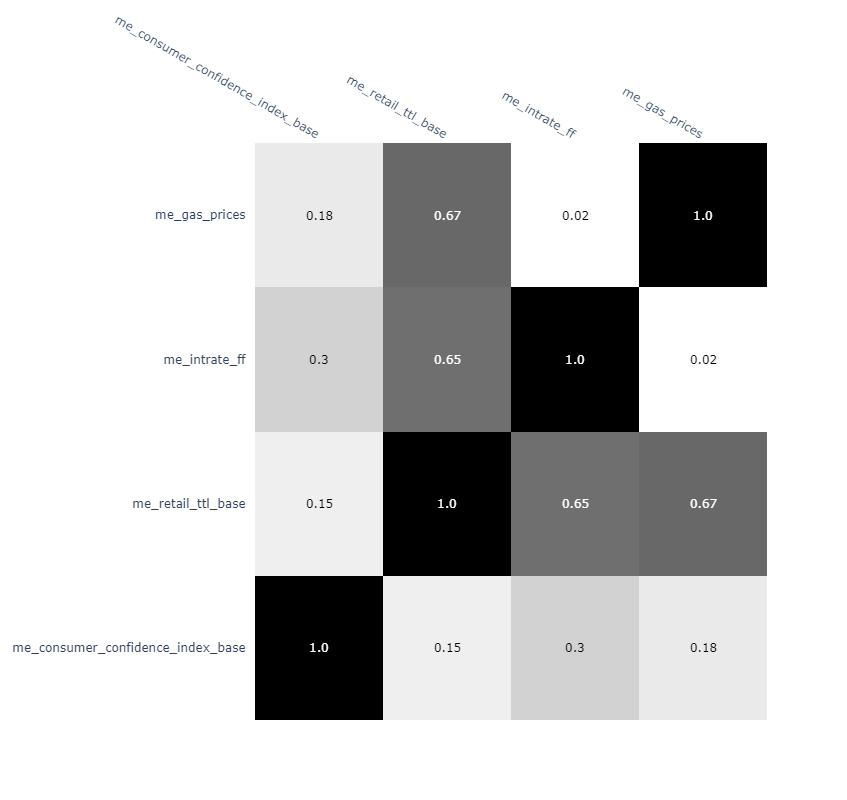

In [ ]:
import plotly.figure_factory as ff
x = list(macro_corr.columns)
y = list(macro_corr.index)
z = np.array(macro_corr)

fig = ff.create_annotated_heatmap(
    abs(z),
    x = x,
    y = y ,
    annotation_text = np.around(abs(z), decimals=2),
    hoverinfo='z',
    colorscale='Greys'#'Viridis'
    )

_ = fig.update_layout(#title={'text':f"Price-Demand curve for {input_params['sku']}", 'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top'},
                      #xaxis_title='Price',
                      #yaxis_title='Demand',
                      #plot_bgcolor='white',
                      width=1200, 
                      height=800,
                      #legend=dict(x=0.5, y=-0.1,  xanchor='center', yanchor='top',orientation='h')
                     )
fig.show()

---

### Models Archives

##### model (4)

In [ ]:
## Data Comments:
# - store closure days were removed from the dataset: easter, christmas, thanksgiving
# with pm.Model(coords=coords) as model4:
#     # data
#     sku_idx = pm.MutableData("sku_idx", sku, dims="obs_id")
#     price_idx = pm.MutableData("log_price", agg_data['log_price'].values, dims="obs_id")
#     retail_idx = pm.MutableData("retail", agg_data['retail_flg'].values, dims="obs_id")
#     retailXnstores_idx = pm.MutableData("retailXnstores", agg_data['retailXnstores'].values, dims="obs_id")
#     trend_idx = pm.MutableData("trend", agg_data['trend'].values, dims="obs_id")
#     c2price_flg_idx = pm.MutableData('c2price_flg', agg_data['cmptr_prc_2_flg'].values, dims="obs_id")
#     c2price_idx = pm.MutableData('c2price', agg_data['log_cmptr_prc_2'].values, dims="obs_id")
#     c10price_flg_idx = pm.MutableData('c10price_flg', agg_data['cmptr_prc_10_flg'].values, dims="obs_id")
#     c10price_idx = pm.MutableData('c10price', agg_data['log_cmptr_prc_10'].values, dims="obs_id")
#     ar1_idx = pm.MutableData('ar1', agg_data['ar1'].values, dims="obs_id")
#     ar7_idx = pm.MutableData('ar7', agg_data['ar7'].values, dims="obs_id")
#     promo_idx = pm.MutableData("promo", agg_data['promo_flg'].values, dims="obs_id")
#     h_christmas_idx = pm.MutableData("h_christmas", agg_data['christmas'].values, dims="obs_id")
#     h_independence_idx = pm.MutableData("h_independence", agg_data['independence'].values, dims="obs_id")
#     h_labor_idx = pm.MutableData("h_labor", agg_data['labor'].values, dims="obs_id")
#     h_memorial_idx = pm.MutableData("h_memorial", agg_data['memorial'].values, dims="obs_id")
#     h_newyears_idx = pm.MutableData("h_newyears", agg_data['newyears'].values, dims="obs_id")
#     h_thanksgiving_idx = pm.MutableData("h_thanksgiving", agg_data['thanksgiving'].values, dims="obs_id")
#     h_blackfriday_idx = pm.MutableData("h_blackfriday", agg_data['blackfriday'].values, dims="obs_id")
#     h_easter_idx = pm.MutableData("h_easter", agg_data['easter'].values, dims="obs_id")
#     h_veterans_idx = pm.MutableData("h_veterans", agg_data['veterans'].values, dims="obs_id")
#     pandemic_idx = pm.MutableData("pandemic", agg_data['pandemic_flg'].values, dims="obs_id")
#     wkend_idx = pm.MutableData("wkend", agg_data['wkend_flg'].values, dims="obs_id")
    
#     # dow_idx = pm.MutableData("dow", agg_data['fisc_day_of_wk_nbr'].values, dims="obs_id")
#     # mnth_1_idx = pm.MutableData("mnth_1", agg_data['mnth_1'].values, dims="obs_id")
#     mnth_2_idx = pm.MutableData("mnth_2", agg_data['mnth_2'].values, dims="obs_id")
#     mnth_3_idx = pm.MutableData("mnth_3", agg_data['mnth_3'].values, dims="obs_id")
#     mnth_4_idx = pm.MutableData("mnth_4", agg_data['mnth_4'].values, dims="obs_id")
#     mnth_5_idx = pm.MutableData("mnth_5", agg_data['mnth_5'].values, dims="obs_id")
#     mnth_6_idx = pm.MutableData("mnth_6", agg_data['mnth_6'].values, dims="obs_id")
#     mnth_7_idx = pm.MutableData("mnth_7", agg_data['mnth_7'].values, dims="obs_id")
#     mnth_8_idx = pm.MutableData("mnth_8", agg_data['mnth_8'].values, dims="obs_id")
#     mnth_9_idx = pm.MutableData("mnth_9", agg_data['mnth_9'].values, dims="obs_id")
#     mnth_10_idx = pm.MutableData("mnth_10", agg_data['mnth_10'].values, dims="obs_id")
#     mnth_11_idx = pm.MutableData("mnth_11", agg_data['mnth_11'].values, dims="obs_id")
#     mnth_12_idx = pm.MutableData("mnth_12", agg_data['mnth_12'].values, dims="obs_id")
    

#     # Priors
#     mu_a = pm.Normal("mu_a", mu=0.0, sigma=10.0)
#     sigma_a = pm.Exponential("sigma_a", 1)

#     mu_b = pm.Normal("mu_b", mu=0.0, sigma=10.0)
#     sigma_b = pm.Exponential("sigma_b", 1)

#     # Random intercepts
#     alpha = pm.Normal("alpha", mu=mu_a, sigma=sigma_a, dims="sku")
#     # Random slopes
#     beta_price = pm.Normal("beta_price", mu=mu_b, sigma=sigma_b, dims="sku")
#     # Fixed slopes
#     beta_retail = pm.Normal("beta_retail", mu=0, sigma=10,)
#     beta_retailXnstores = pm.Normal("beta_retailXnstores", mu=0, sigma=10,)
#     beta_trend = pm.Normal("beta_trend", mu=0, sigma=10,)
#     beta_c2price_flg = pm.Normal("beta_c2price_flg", mu=0, sigma=10,)
#     beta_c2price = pm.Normal("beta_c2price", mu=0, sigma=10,)
#     beta_c10price_flg = pm.Normal("beta_c10price_flg", mu=0, sigma=10,)
#     beta_c10price = pm.Normal("beta_c10price", mu=0, sigma=10,)
#     beta_ar1 = pm.Normal("beta_ar1", mu=0, sigma=10,)
#     beta_ar7 = pm.Normal("beta_ar7", mu=0, sigma=10)
#     beta_promo = pm.Normal("beta_promo", mu=0, sigma=10)
    
#     beta_h_christmas = pm.Normal("beta_h_christmas", mu=0, sigma=10)
#     beta_h_independence = pm.Normal("beta_h_independence", mu=0, sigma=10)
#     beta_h_labor = pm.Normal("beta_h_labor", mu=0, sigma=10)
#     beta_h_memorial = pm.Normal("beta_h_memorial", mu=0, sigma=10)
#     beta_h_newyears = pm.Normal("beta_h_newyears", mu=0, sigma=10)
#     beta_h_thanksgiving = pm.Normal("beta_h_thanksgiving", mu=0, sigma=10)
#     beta_h_blackfriday = pm.Normal("beta_h_blackfriday", mu=0, sigma=10)
#     beta_h_easter = pm.Normal("beta_h_easter", mu=0, sigma=10)
#     beta_h_veterans = pm.Normal("beta_h_veterans", mu=0, sigma=10)
    
#     beta_pandemic = pm.Normal("beta_pandemic", mu=0, sigma=10)
#     beta_wkend = pm.Normal("beta_wkend", mu=0, sigma=10)
    
#     # beta_dow = pm.Normal("beta_dow", mu=0, sigma=10)
#     # beta_mnth1 = pm.Normal("beta_mnth1", mu=0, sigma=10)
#     beta_mnth2 = pm.Normal("beta_mnth2", mu=0, sigma=10)
#     beta_mnth3 = pm.Normal("beta_mnth3", mu=0, sigma=10)
#     beta_mnth4 = pm.Normal("beta_mnth4", mu=0, sigma=10)
#     beta_mnth5 = pm.Normal("beta_mnth5", mu=0, sigma=10)
#     beta_mnth6 = pm.Normal("beta_mnth6", mu=0, sigma=10)
#     beta_mnth7 = pm.Normal("beta_mnth7", mu=0, sigma=10)
#     beta_mnth8 = pm.Normal("beta_mnth8", mu=0, sigma=10)
#     beta_mnth9 = pm.Normal("beta_mnth9", mu=0, sigma=10)
#     beta_mnth10 = pm.Normal("beta_mnth10", mu=0, sigma=10)
#     beta_mnth11 = pm.Normal("beta_mnth11", mu=0, sigma=10)
#     beta_mnth12 = pm.Normal("beta_mnth12", mu=0, sigma=10)

#     # Model error
#     sigma_y = pm.Exponential("sigma_y", 1)

#     # Expected value
#     y_hat = alpha[sku_idx] + \
#             beta_price[sku_idx] * price_idx + \
#             beta_retail * retail_idx + \
#             beta_retailXnstores * retailXnstores_idx + \
#             beta_trend * trend_idx + \
#             beta_c2price_flg * c2price_flg_idx + \
#             beta_c2price * c2price_idx + \
#             beta_c10price_flg * c10price_flg_idx + \
#             beta_c10price * c10price_idx + \
#             beta_ar1 * ar1_idx + \
#             beta_ar7 * ar7_idx + \
#             beta_promo * promo_idx + \
#             beta_h_christmas * h_christmas_idx + \
#             beta_h_independence * h_independence_idx + \
#             beta_h_labor * h_labor_idx + \
#             beta_h_memorial * h_memorial_idx + \
#             beta_h_newyears * h_newyears_idx + \
#             beta_h_thanksgiving * h_thanksgiving_idx + \
#             beta_h_blackfriday * h_blackfriday_idx + \
#             beta_h_easter * h_easter_idx + \
#             beta_h_veterans * h_veterans_idx + \
#             beta_wkend * wkend_idx + \
#             beta_pandemic * pandemic_idx + \
#             beta_mnth2 * mnth_2_idx + \
#             beta_mnth3 * mnth_3_idx + \
#             beta_mnth4 * mnth_4_idx + \
#             beta_mnth5 * mnth_5_idx + \
#             beta_mnth6 * mnth_6_idx + \
#             beta_mnth7 * mnth_7_idx + \
#             beta_mnth8 * mnth_8_idx + \
#             beta_mnth9 * mnth_9_idx + \
#             beta_mnth10 * mnth_10_idx + \
#             beta_mnth11 * mnth_11_idx + \
#             beta_mnth12 * mnth_12_idx #+\
#             # beta_dow * dow_idx + \

#     # Data likelihood
#     y_like = pm.Normal("y_like", mu=y_hat, sigma=sigma_y, observed=agg_data[f'log_{target_col}'].values, dims="obs_id")

##### model (5)